some markdown here

In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import mannwhitneyu
from scipy.stats import chi2_contingency
import umap
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from adjustText import adjust_text
from matplotlib_venn import venn3, venn3_circles
from matplotlib.colors import ListedColormap

In [2]:
sns.set(style="white", font_scale=0.75, context='notebook', rc={'figure.figsize':(14,10), 'figure.dpi':300})
sns.set_style({'font.family':'serif', 'font.serif':'Times New Roman'})
%matplotlib inline

In [3]:
df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
df_Clinic.head()

,Patient ID,ADAS group,ADAS-COG,SEX,Age,Cigarette,HB,HCT,RBC,WBC,...,HbA1c,TSH,Diastolic blood pressure (mmHg),Sistolic blood pressure (mmHg),Pulse (beats per minute),Waist circumference (cm),Hip circumference (cm),Weight,Height,BMI
0,TR10001,Medium,18.3,1,64,0,13.6,40.0,4.75,7.32,...,5.58,1.58,79.0,141.0,58.0,106.0,112.0,76.0,170.0,26.30
1,TR10002,High,32.0,0,73,0,11.2,33.7,3.92,5.70,...,5.19,3.02,70.0,120.0,67.0,79.0,93.0,50.6,152.0,21.60
2,TR10004,High,36.0,1,80,0,11.9,36.3,4.42,8.43,...,6.85,2.65,80.0,140.0,72.0,142.0,150.0,135.0,170.0,46.71
3,TR10005,High,39.3,0,61,0,13.1,38.5,4.76,5.28,...,5.79,2.17,68.0,125.0,65.0,74.0,94.0,60.0,159.0,23.70
4,TR10006,Medium,29.0,0,68,0,13.0,35.7,4.21,5.67,...,6.08,3.57,80.0,130.0,74.0,87.0,101.0,61.0,149.0,27.40


In [4]:
mask1 = (df_Clinic["SEX"] == 1) & (df_Clinic["ADAS group"] == 'Low')
mask2 = (df_Clinic["SEX"] == 1) & (df_Clinic["ADAS group"] == 'Medium')
mask3 = (df_Clinic["SEX"] == 1) & (df_Clinic["ADAS group"] == 'High')
mask4 = (df_Clinic["SEX"] == 0) & (df_Clinic["ADAS group"] == 'Low')
mask5 = (df_Clinic["SEX"] == 0) & (df_Clinic["ADAS group"] == 'Medium')
mask6 = (df_Clinic["SEX"] == 0) & (df_Clinic["ADAS group"] == 'High')

obs = np.array([[len(df_Clinic[mask1]), len(df_Clinic[mask2]), len(df_Clinic[mask3])], [len(df_Clinic[mask4]), len(df_Clinic[mask5]), len(df_Clinic[mask6])]])
chi2_contingency(obs)

(5.48023956425335,
 0.06456261298289885,
 2,
 array([[ 9.42528736, 21.20689655, 10.36781609],
        [10.57471264, 23.79310345, 11.63218391]]))

In [5]:
df_gender = pd.DataFrame(data=obs, index=['Male', 'Female'], columns=['Low', 'Moderate', 'High'])
df_gender

,Low,Moderate,High
Male,5,23,13
Female,15,22,9


In [6]:
mask1 = (df_Clinic["Cigarette"] == 1) & (df_Clinic["ADAS group"] == 'Low')
mask2 = (df_Clinic["Cigarette"] == 1) & (df_Clinic["ADAS group"] == 'Medium')
mask3 = (df_Clinic["Cigarette"] == 1) & (df_Clinic["ADAS group"] == 'High')
mask4 = (df_Clinic["Cigarette"] == 0) & (df_Clinic["ADAS group"] == 'Low')
mask5 = (df_Clinic["Cigarette"] == 0) & (df_Clinic["ADAS group"] == 'Medium')
mask6 = (df_Clinic["Cigarette"] == 0) & (df_Clinic["ADAS group"] == 'High')

obs = np.array([[len(df_Clinic[mask1]), len(df_Clinic[mask2]), len(df_Clinic[mask3])], [len(df_Clinic[mask4]), len(df_Clinic[mask5]), len(df_Clinic[mask6])]])
chi2_contingency(obs)

(1.0644841269841268,
 0.587286758273629,
 2,
 array([[ 0.68965517,  1.55172414,  0.75862069],
        [19.31034483, 43.44827586, 21.24137931]]))

In [7]:
df_smoke = pd.DataFrame(data=obs, index=['Yes', 'No'], columns=['Low', 'Moderate', 'High'])
df_smoke

,Low,Moderate,High
Yes,1,2,0
No,19,43,22


In [8]:
# Age distribution
low = list(df_Clinic[df_Clinic['ADAS group']=='Low']['Age'])
medium = list(df_Clinic[df_Clinic['ADAS group']=='Medium']['Age'])
high = list(df_Clinic[df_Clinic['ADAS group']=='High']['Age'])

s1, p1 = stats.kstest(low, medium)
s2, p2 = stats.kstest(low, high)
s3, p3 = stats.kstest(medium, high)

array = np.array([['*', p1, p2], [s1, '*', p3], [s2, s3, '*']])
df_age = pd.DataFrame(data=array, index=['Low', 'Moderate', 'High'], columns=['Low', 'Moderate', 'High'])
df_age

,Low,Moderate,High
Low,*,0.3247242123119076,0.08006583281998286
Moderate,0.24444444444444444,*,0.6774726460544684
High,0.37272727272727274,0.17373737373737375,*


In [9]:
# BMI distribution
lowgroup = list(df_Clinic[df_Clinic['ADAS group']=='Low']['BMI'])
mediumgroup = list(df_Clinic[df_Clinic['ADAS group']=='Medium']['BMI'])
highgroup = list(df_Clinic[df_Clinic['ADAS group']=='High']['BMI'])

lowgroup = [x for x in lowgroup if str(x) != 'nan']
mediumgroup = [x for x in mediumgroup if str(x) != 'nan']
highgroup = [x for x in highgroup if str(x) != 'nan']

s1, p1 = stats.kstest(lowgroup, mediumgroup)
s2, p2 = stats.kstest(lowgroup, highgroup)
s3, p3 = stats.kstest(mediumgroup, highgroup)

array = np.array([['*', p1, p2], [s1, '*', p3], [s2, s3, '*']])
df_bmi = pd.DataFrame(data=array, index=['Low', 'Moderate', 'High'], columns=['Low', 'Moderate', 'High'])
df_bmi

,Low,Moderate,High
Low,*,0.0649962908199911,0.04702475687203622
Moderate,0.3388888888888889,*,0.3924657382761711
High,0.4119047619047619,0.2253968253968254,*


In [10]:
# create a copy of the DataFrame
df_Clinic_copy = df_Clinic.copy()
# replace 'Medium' with 'Moderate' in the 'ADAS group' column of df_copy
df_Clinic_copy['ADAS-Cog group'] = df_Clinic_copy['ADAS group'].replace('Medium', 'Moderate')

# drop the original 'ADAS group' column
df_Clinic_copy = df_Clinic_copy.drop('ADAS group', axis=1)
df_Clinic_copy

,Patient ID,ADAS-COG,SEX,Age,Cigarette,HB,HCT,RBC,WBC,Platelet,...,TSH,Diastolic blood pressure (mmHg),Sistolic blood pressure (mmHg),Pulse (beats per minute),Waist circumference (cm),Hip circumference (cm),Weight,Height,BMI,ADAS-Cog group
0,TR10001,18.3,1,64,0,13.6,40.0,4.75,7.32,224,...,1.58,79.0,141.0,58.0,106.0,112.0,76.0,170.0,26.30,Moderate
1,TR10002,32.0,0,73,0,11.2,33.7,3.92,5.70,80,...,3.02,70.0,120.0,67.0,79.0,93.0,50.6,152.0,21.60,High
2,TR10004,36.0,1,80,0,11.9,36.3,4.42,8.43,225,...,2.65,80.0,140.0,72.0,142.0,150.0,135.0,170.0,46.71,High
3,TR10005,39.3,0,61,0,13.1,38.5,4.76,5.28,195,...,2.17,68.0,125.0,65.0,74.0,94.0,60.0,159.0,23.70,High
4,TR10006,29.0,0,68,0,13.0,35.7,4.21,5.67,229,...,3.57,80.0,130.0,74.0,87.0,101.0,61.0,149.0,27.40,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,TR20109,13.0,0,64,0,11.9,36.0,4.47,8.13,190,...,0.88,78.0,171.0,66.0,95.0,93.0,70.0,164.0,26.03,Low
83,TR20114,20.0,1,63,0,11.9,37.7,5.47,7.17,203,...,1.07,81.0,166.0,52.0,89.0,96.0,67.0,154.0,28.25,Moderate
84,TR20117,60.0,1,65,0,12.2,38.5,3.83,8.45,333,...,0.52,79.0,122.0,81.0,71.0,85.0,55.0,158.0,22.03,High
85,TR20118,24.0,0,62,0,12.8,39.2,4.79,6.07,223,...,1.09,74.0,145.0,70.0,112.0,133.0,110.0,159.0,43.51,Moderate


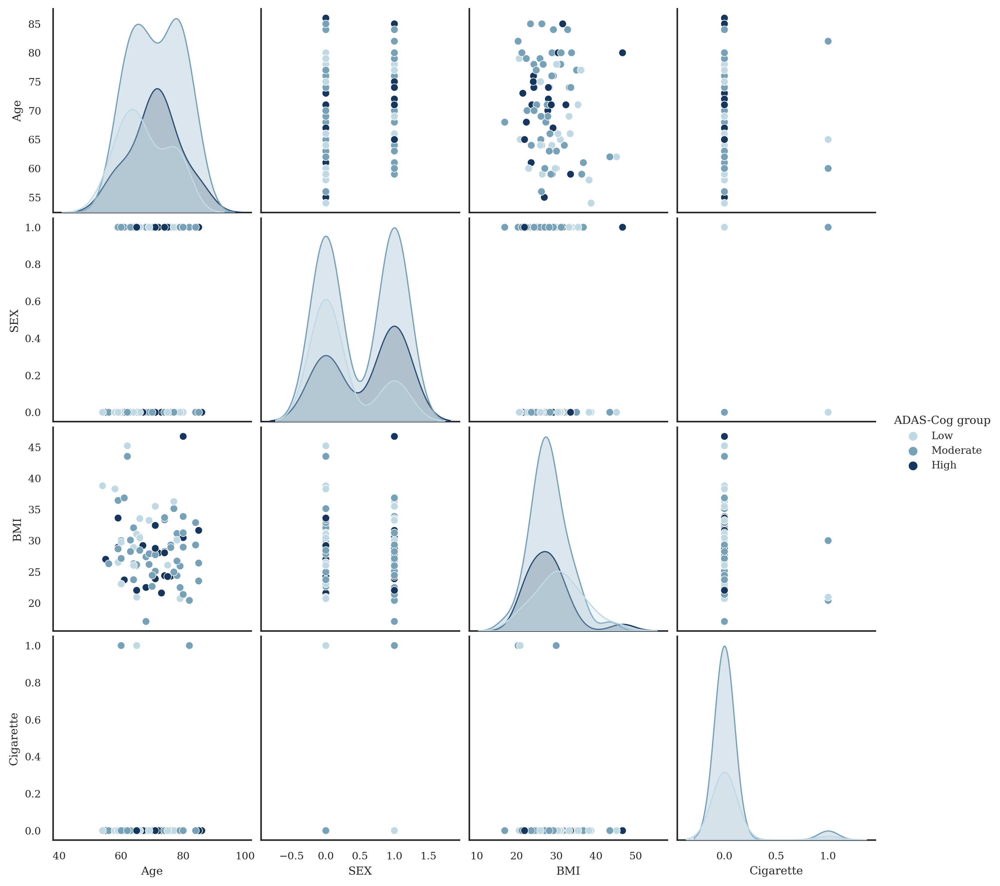

In [11]:
plt.rcParams['figure.dpi'] = 300
ax = sns.pairplot(df_Clinic_copy[['Age', 'SEX', 'BMI', 'Cigarette','ADAS-Cog group']], hue='ADAS-Cog group', hue_order = ['Low', 'Moderate', 'High'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], diag_kind="kde");
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [12]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 1.xlsx", engine='openpyxl', mode='a') as writer:
#     df_gender.to_excel(writer, sheet_name='gender')
#     df_smoke.to_excel(writer, sheet_name='smoke')
#     df_age.to_excel(writer, sheet_name='age')
#     df_bmi.to_excel(writer, sheet_name='bmi')

In [13]:
sns.set(style="white", font_scale=0.75, context='notebook', rc={'figure.figsize':(4,4), 'figure.dpi':300})
sns.set_style({'font.family':'serif', 'font.serif':'Times New Roman'})

In [14]:
arr = list(df_Clinic.columns)
items_to_remove = ['Patient ID', 'ADAS-COG', 'ADAS group', 'Age', 'SEX', 'BMI', 'Cigarette']

arr = [x for x in arr if x not in items_to_remove]

In [15]:
df_Clinic_Low = df_Clinic[df_Clinic['ADAS group'] == 'Low']
df_Clinic_Medium = df_Clinic[df_Clinic['ADAS group'] == 'Medium']
df_Clinic_High = df_Clinic[df_Clinic['ADAS group'] == 'High']
X_Low = np.asarray(df_Clinic_Low[arr])
X_Medium = np.asarray(df_Clinic_Medium[arr])
X_High = np.asarray(df_Clinic_High[arr])

In [16]:
log2fc = []
stat = []
pvals = []

for i in range(0, len(arr)):
    temp1, temp2 = X_Low[:,i][~np.isnan(X_Low[:,i])], X_Medium[:,i][~np.isnan(X_Medium[:,i])]
    log2fc.append(np.log2(np.average(temp2)/np.average(temp1)))
    s, p = mannwhitneyu(temp1, temp2)
    stat.append(s)
    pvals.append(p)

data = {'Log2FC': log2fc, 'u stat': stat, 'p value': pvals}
df_Clinic_Medium_vs_Low = pd.DataFrame(data, index = arr)
df_Clinic_Medium_vs_Low[df_Clinic_Medium_vs_Low['p value']<0.05]

,Log2FC,u stat,p value
Platelet,-0.228544,608.0,0.025156
Albumin,-0.031322,577.0,0.046744
Triglycerides,-0.956022,693.0,0.000567
Insulin,-0.790098,529.0,0.043716


In [17]:
log2fc = []
stat = []
pvals = []

for i in range(0, len(arr)):
    temp1, temp2 = X_Low[:,i][~np.isnan(X_Low[:,i])], X_High[:,i][~np.isnan(X_High[:,i])]
    log2fc.append(np.log2(np.average(temp2)/np.average(temp1)))
    s, p = mannwhitneyu(temp1, temp2)
    stat.append(s)
    pvals.append(p)

data = {'Log2FC': log2fc, 'u stat': stat, 'p value': pvals}
df_Clinic_High_vs_Low = pd.DataFrame(data, index = arr)
df_Clinic_High_vs_Low[df_Clinic_High_vs_Low['p value']<0.05]

,Log2FC,u stat,p value
ALT,-0.302735,299.0,0.047710
Triglycerides,-0.982826,348.5,0.001263
Insulin,-0.687197,288.0,0.040137
HbA1c,-0.149101,290.5,0.034146


In [18]:
log2fc = []
stat = []
pvals = []

for i in range(0, len(arr)):
    temp1, temp2 = X_Medium[:,i][~np.isnan(X_Medium[:,i])], X_High[:,i][~np.isnan(X_High[:,i])]
    log2fc.append(np.log2(np.average(temp2)/np.average(temp1)))
    s, p = mannwhitneyu(temp1, temp2)
    stat.append(s)
    pvals.append(p)

data = {'Log2FC': log2fc, 'u stat': stat, 'p value': pvals}
df_Clinic_High_vs_Medium = pd.DataFrame(data, index = arr)
df_Clinic_High_vs_Medium[df_Clinic_High_vs_Medium['p value']<0.05]

,Log2FC,u stat,p value


Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [19]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 1.xlsx", engine='openpyxl', mode='a') as writer:
#     df_Clinic_High_vs_Low.to_excel(writer, sheet_name='High_vs_Low')
#     df_Clinic_High_vs_Medium.to_excel(writer, sheet_name='High_vs_Medium')
#     df_Clinic_Medium_vs_Low.to_excel(writer, sheet_name='Medium_vs_Low')

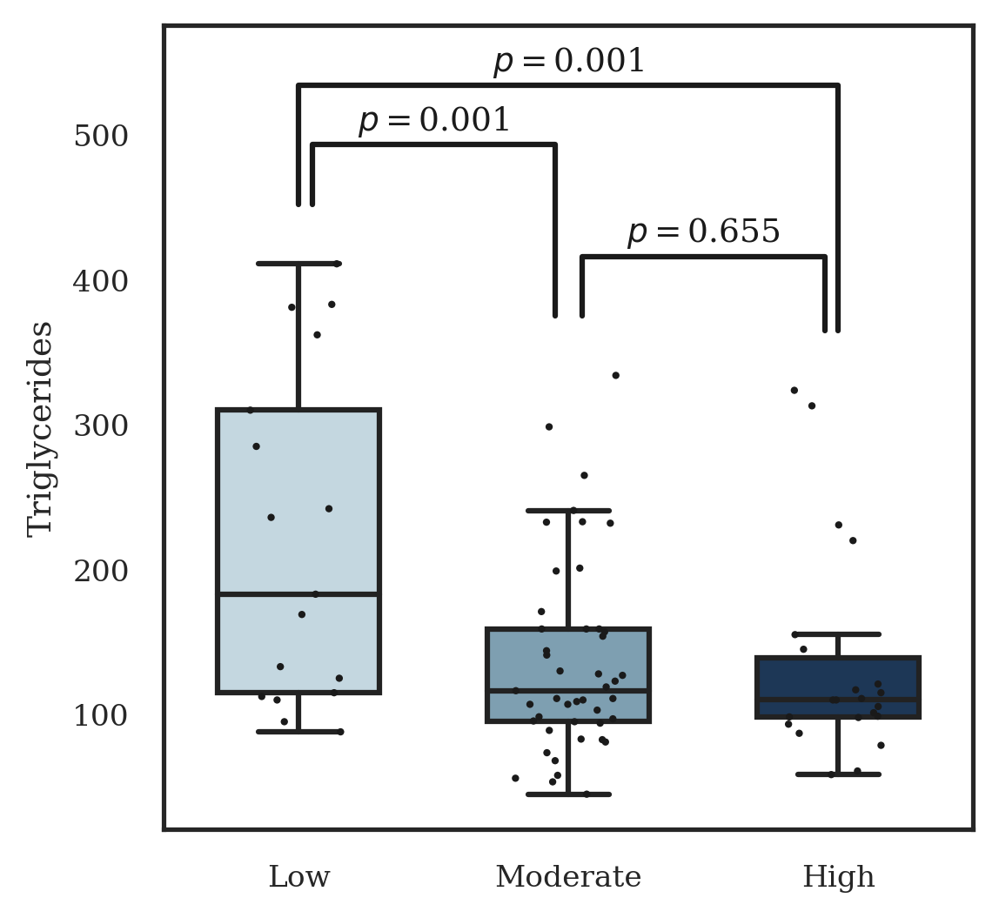

In [20]:
name = 'Triglycerides'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+3*std)&(df_Clinic[name]>mean-3*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)
ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
h, col = df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+3*h, y1+3*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+2*h, y1+2*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+2*h, y2+2*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+4*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])

plt.show()

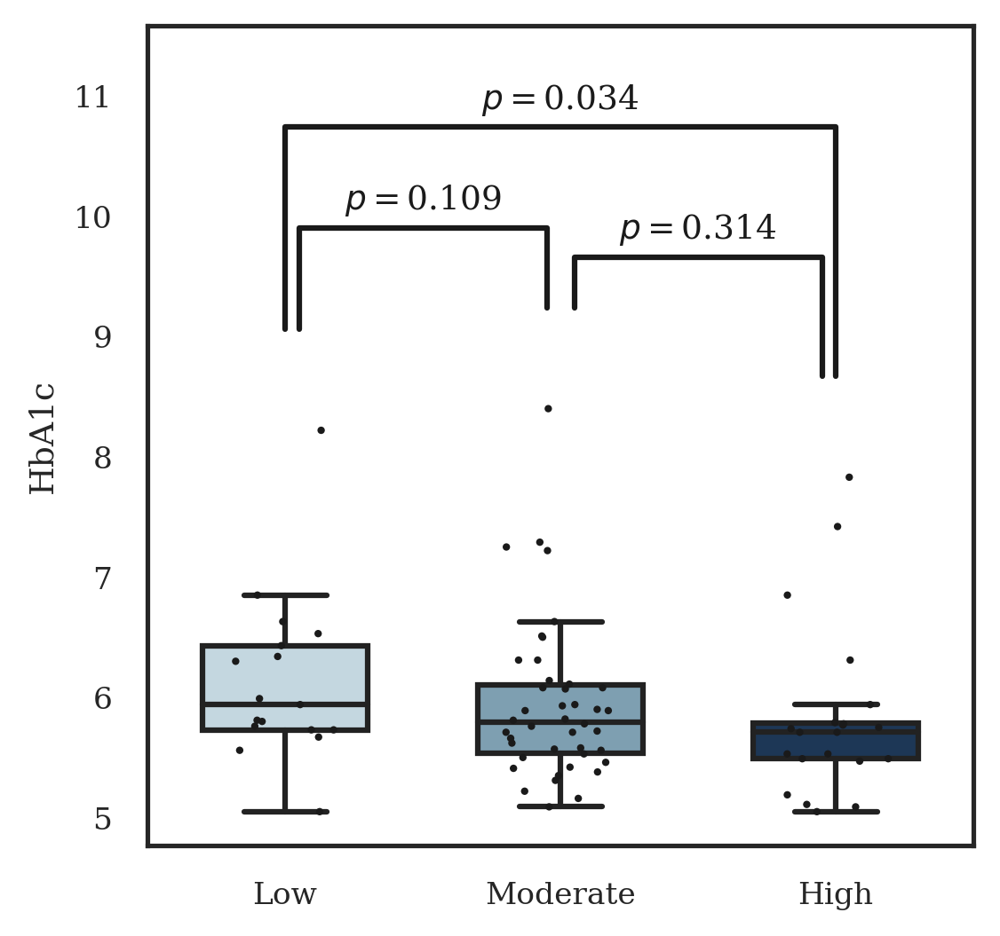

In [21]:
name = 'HbA1c'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+2*std)&(df_Clinic[name]>mean-2*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)

ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
h, col = df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+3*h, y1+3*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+2*h, y1+2*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+1.5*h, y2+1.5*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+1.6*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+4*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])

plt.show()

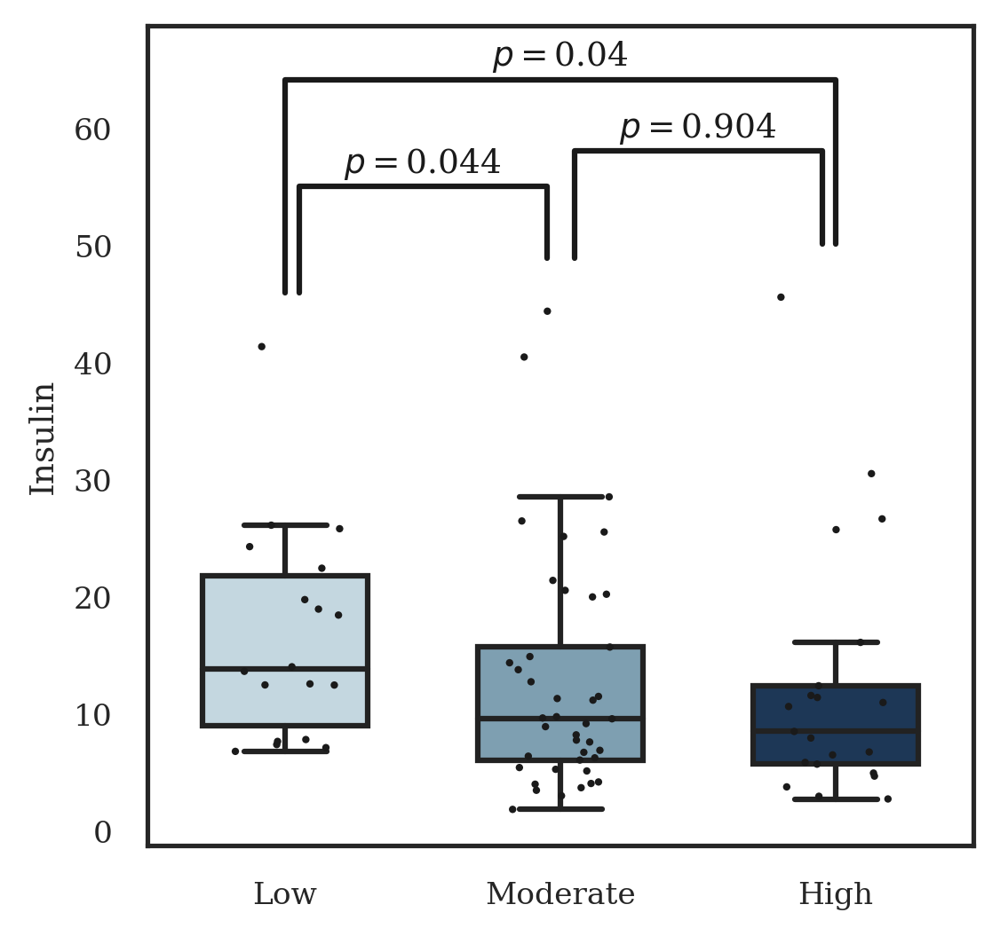

In [22]:
name = 'Insulin'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+2*std)&(df_Clinic[name]>mean-2*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)

ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
y, h, col = df_Clinic[name].max(), df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+5*h, y1+5*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+5.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+3*h, y1+3*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+3*h, y2+3*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+6*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])
plt.show()

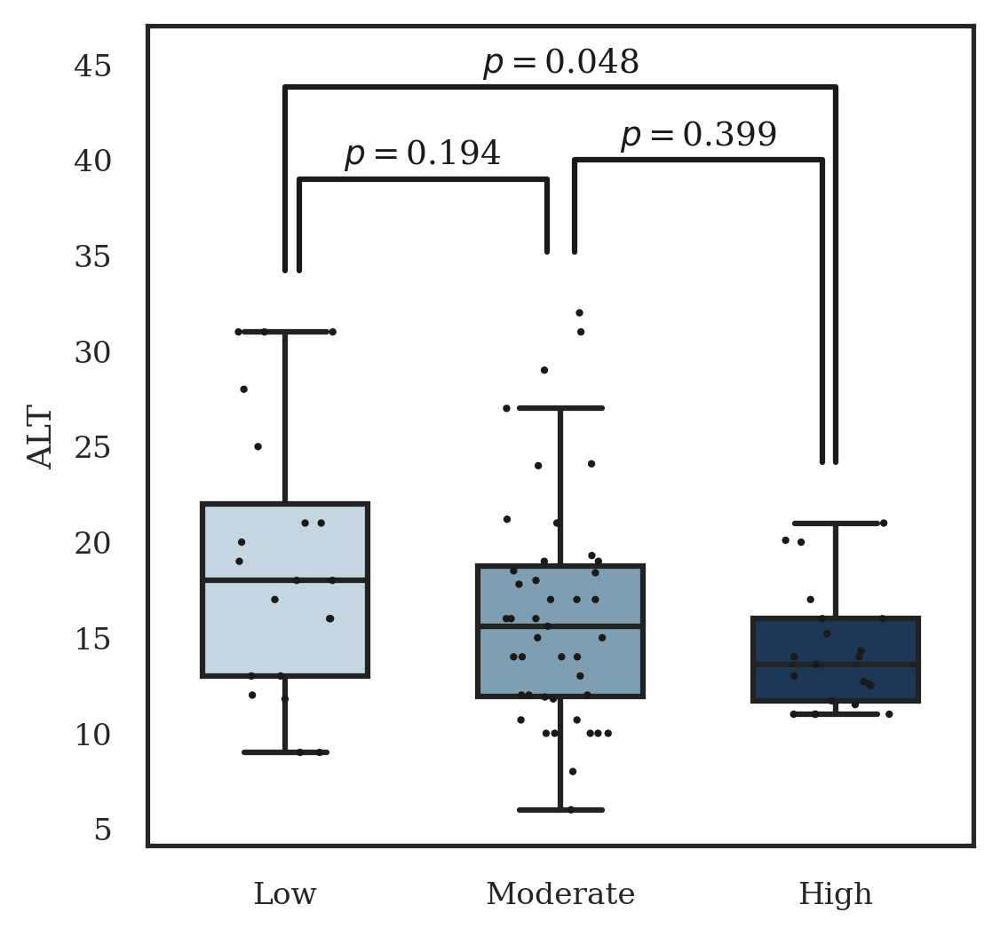

In [23]:
name = 'ALT'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+2*std)&(df_Clinic[name]>mean-2*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)

ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
y, h, col = df_Clinic[name].max(), df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+4*h, y1+4*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+4.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+2.5*h, y1+2.5*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+2.6*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+2.5*h, y2+2.5*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+2.6*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+5*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])
plt.show()

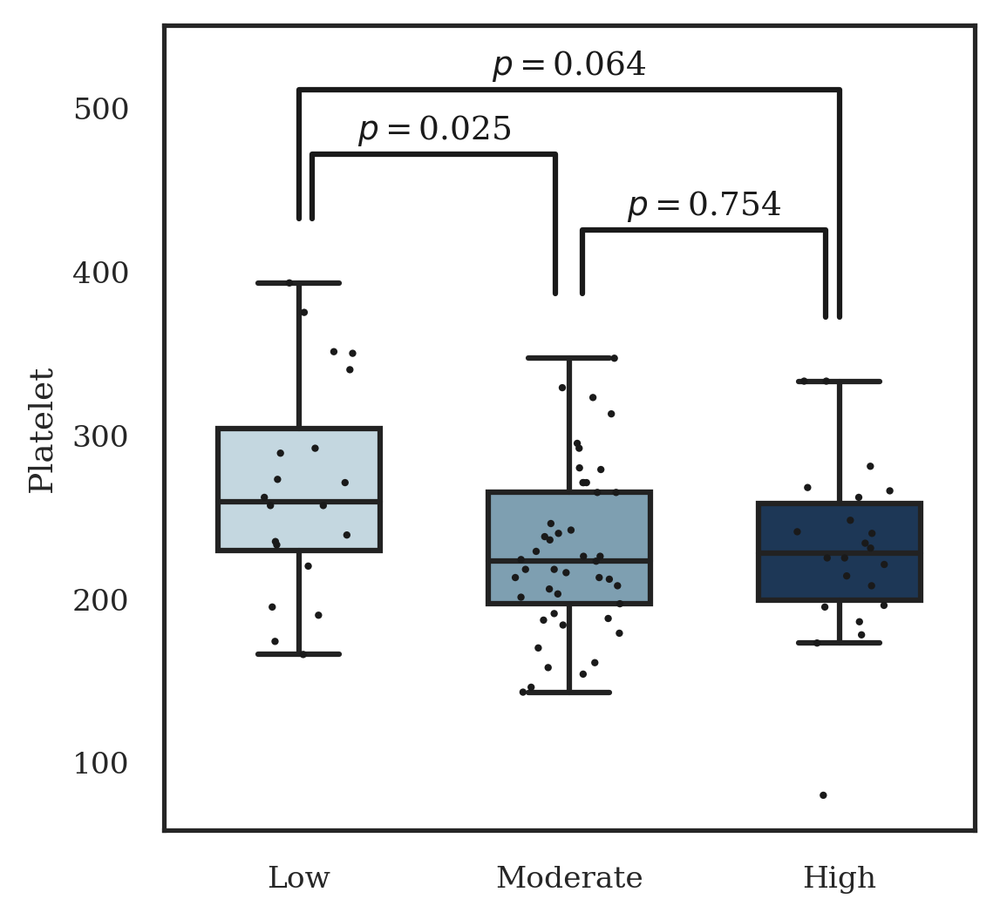

In [24]:
name = 'Platelet'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+3*std)&(df_Clinic[name]>mean-3*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)
ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
h, col = df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+3*h, y1+3*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+2*h, y1+2*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+2*h, y2+2*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+4*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])
plt.show()

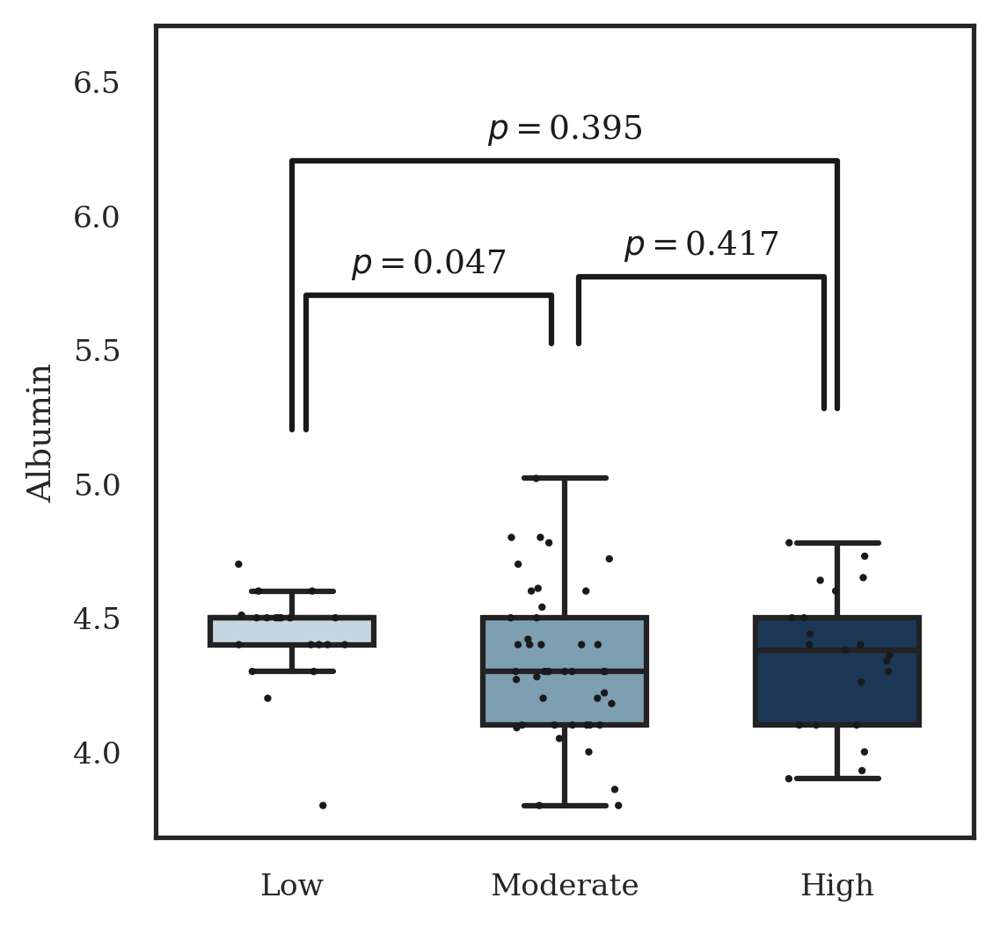

In [25]:
name = 'Albumin'

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
mean, std = np.mean(df_Clinic[name]), np.std(df_Clinic[name])
df_Clinic = df_Clinic[(df_Clinic[name]<mean+3*std)&(df_Clinic[name]>mean-3*std)]

ax = sns.boxplot(x="ADAS group", y=name, data=df_Clinic, palette = ['#BFD9E5', '#76A2B9', '#14365F'], order = ['Low', 'Medium', 'High'], showfliers = False, width=0.6)
ax = sns.stripplot(x="ADAS group", y=name, data=df_Clinic, color="k", order = ['Low', 'Medium', 'High'], jitter = 0.2, size=2)

# statistical annotation
x1, x2, x3 = 0, 1, 2
y1, y2, y3 = df_Clinic[df_Clinic['ADAS group']=='Low'][name].max(), df_Clinic[df_Clinic['ADAS group']=='Medium'][name].max(), df_Clinic[df_Clinic['ADAS group']=='High'][name].max()
h, col = df_Clinic[name].max()/10, 'k'
plt.plot([x1, x1, x3, x3], [y1+h, y1+3*h, y1+3*h, y3+h], lw=1.5, c=col)
plt.text((x1+x3)*.5, y1+3.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x1+0.05, x1+0.05, x2-0.05, x2-0.05], [y1+h, y1+2*h, y1+2*h, y2+h], lw=1.5, c=col)
plt.text((x1+x2)*.5, y1+2.1*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Low.loc[:, name].dropna(), df_Clinic_Medium.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.plot([x2+0.05, x2+0.05, x3-0.05, x3-0.05], [y2+h, y2+1.5*h, y2+1.5*h, y3+h], lw=1.5, c=col)
plt.text((x2+x3)*.5, y2+1.6*h, "$p=$" + str(np.around(mannwhitneyu(df_Clinic_Medium.loc[:, name].dropna(), df_Clinic_High.loc[:, name].dropna())[1], 3)), ha='center', va='bottom', color=col)

plt.ylim(top=y1+4*h)
plt.xlabel('')
plt.xticks([0, 1, 2], ['Low', 'Moderate', 'High'])
plt.show()

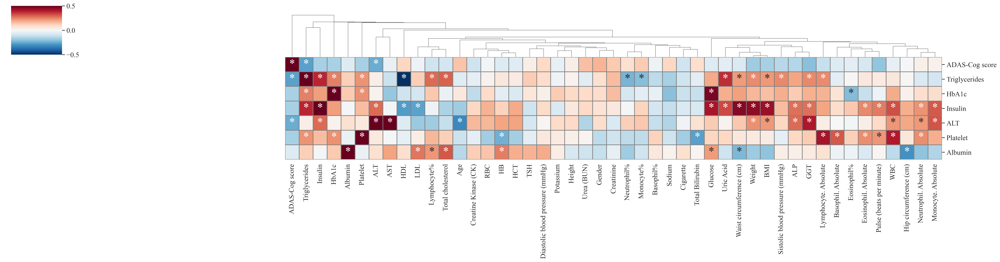

In [26]:
hex_colors = ['#67001f','#b2182b','#d6604d','#f4a582','#fddbc7','#f7f7f7','#d1e5f0','#92c5de','#4393c3','#2166ac','#053061']
hex_colors.reverse()
rgb_colors = [colors.hex2color(h) for h in hex_colors]
cmap = colors.LinearSegmentedColormap.from_list('mycmap', rgb_colors, N=256)

df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name = 'Clinic_v1_imputed')
df_Clinic = df_Clinic.drop(columns=['ADAS group'])
df_Clinic = df_Clinic.rename(columns={'ADAS-COG': 'ADAS-Cog score', 'SEX': 'Gender'})
df_Clinic_select = df_Clinic[['Patient ID', 'ADAS-Cog score', 'Triglycerides', 'HbA1c', 'Insulin', 'ALT', 'Platelet', 'Albumin']]
df_Clinic = df_Clinic.set_index('Patient ID').T
df_Clinic_select = df_Clinic_select.set_index('Patient ID').T

rows, cols = (len(df_Clinic_select), len(df_Clinic))
text = [[' ']*cols]*rows
text = np.asarray(text)
X = np.zeros((len(df_Clinic_select), len(df_Clinic)))

for i in range(len(df_Clinic_select)):
    for j in range(len(df_Clinic)):
        r, p = stats.spearmanr(df_Clinic_select.iloc[i, 0:], df_Clinic.iloc[j, 0:])
        X[i, j] = r
        if p<0.05:
            text[i][j] = '*'
            
df_Clinic_Correlation = pd.DataFrame(X, columns=list(df_Clinic.index), index=list(df_Clinic_select.index))

plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 25})
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

sns.clustermap(df_Clinic_Correlation, annot=text, fmt="", figsize=(30, 8), row_cluster=False, cmap=cmap, dendrogram_ratio=0.3, center=0, cbar_kws={"ticks":[-0.5, 0, 0.5]}, vmax=0.5, vmin=-0.5, linewidths=1, linecolor='grey')

plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [27]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 1.xlsx", engine='openpyxl', mode='a') as writer:
#     df_Clinic_Correlation.to_excel(writer, sheet_name='Correlation')

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


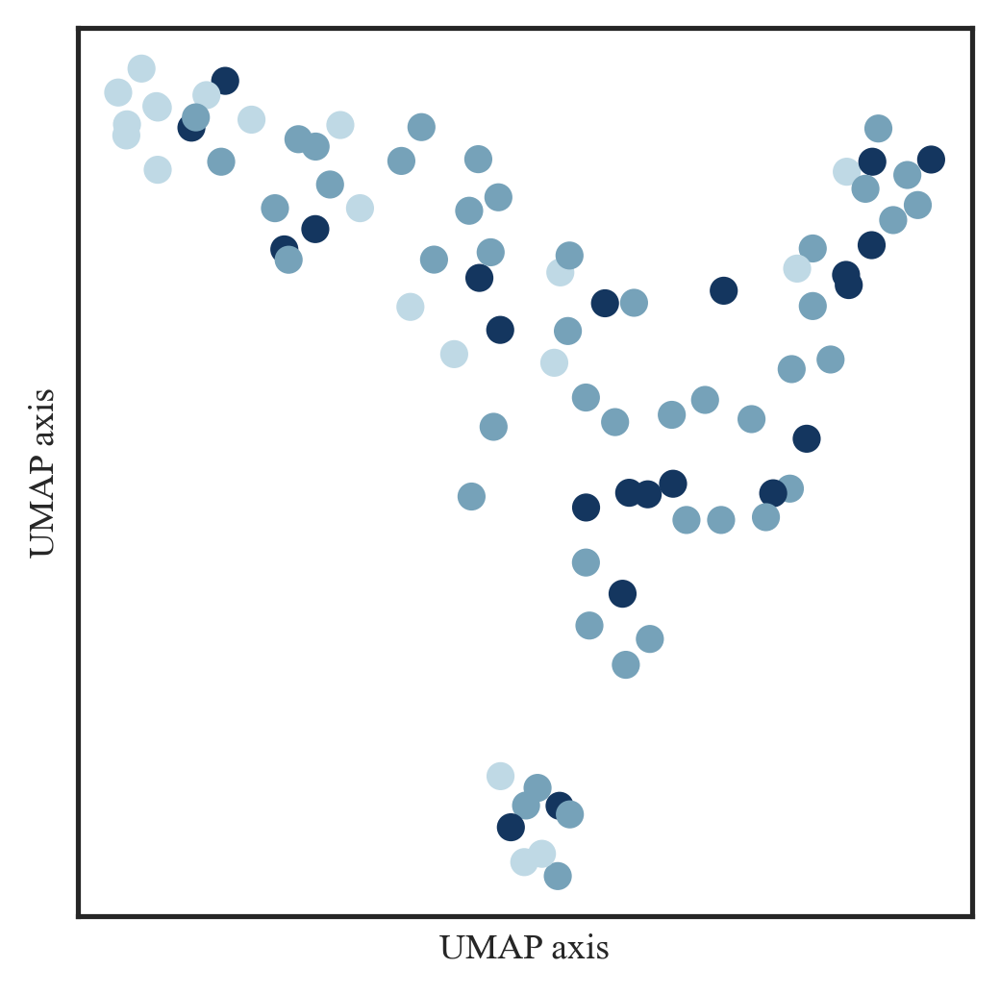

In [28]:
df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name = 'Clinic_v1_imputed')
df_Clinic = df_Clinic[['ADAS group', 'Triglycerides', 'HbA1c', 'Insulin', 'ALT', 'Platelet', 'Albumin']]
label_color_map = {'Low': '#BFD9E5', 'Medium': '#76A2B9', 'High': '#14365F'}
colorset = [label_color_map[label] for label in list(df_Clinic['ADAS group'])]

# create a UMAP model
model = umap.UMAP(n_neighbors=25, n_components=2, random_state=0)

# fit the model to the data
embedding = model.fit_transform(df_Clinic.iloc[:,1:])

# plot the data
plt.scatter(embedding[:, 0], embedding[:, 1], c = colorset)
# Hide the tick marks
plt.xticks([])
plt.yticks([])
plt.xlabel('UMAP axis')
plt.ylabel('UMAP axis')
plt.show()

## Figure 2 - Proteomics analysis

In [29]:
plt.rcParams['figure.figsize'] = [5.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower left'
plt.rcParams['legend.fontsize'] = 'small'

In [30]:
df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name = 'Clinic_v1_imputed')
df_Proteomics = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='Proteomics_v1')
df_Proteomics = df_Clinic.iloc[:,:2].merge(df_Proteomics, on='Patient ID')

Gene_name = list(df_Proteomics.columns)
Gene_name.remove('Patient ID')
Gene_name.remove('ADAS group')

df_Proteomics_Low = df_Proteomics[df_Proteomics['ADAS group']=='Low']
df_Proteomics_Medium = df_Proteomics[df_Proteomics['ADAS group']=='Medium']
df_Proteomics_High = df_Proteomics[df_Proteomics['ADAS group']=='High']

Gene_short = []
for item in Gene_name:
    Gene_short.append(item.split('-')[0])

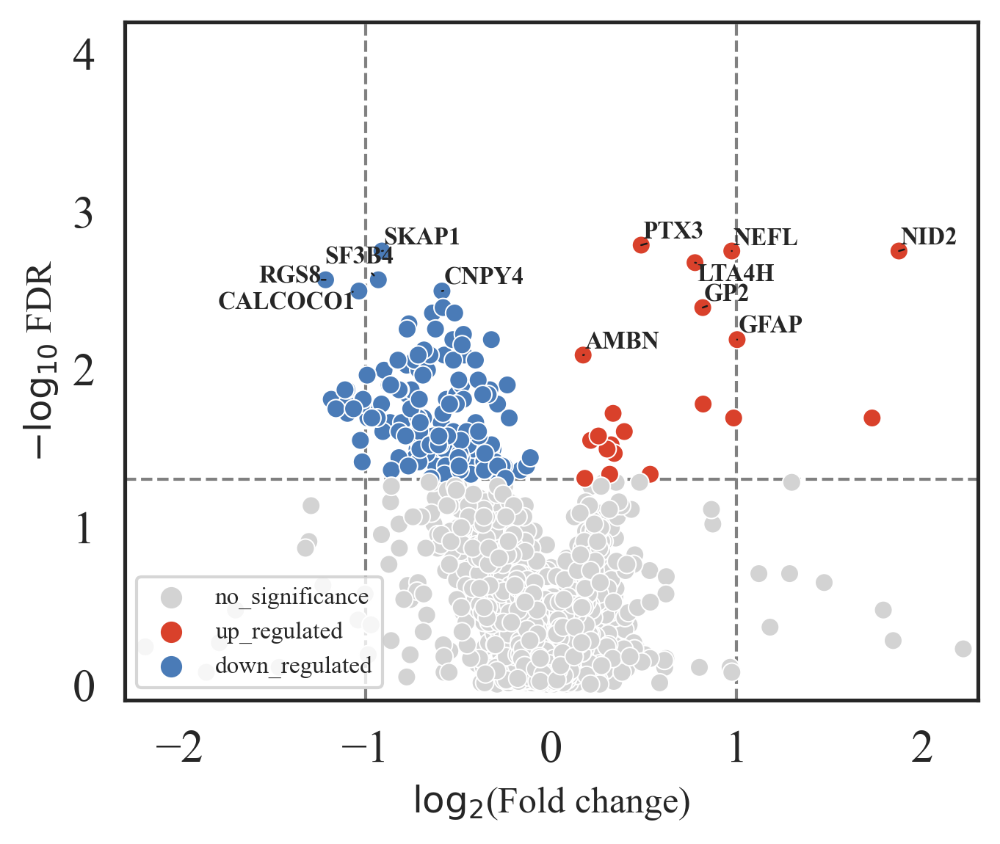

In [31]:
df_Proteomics_Compare = pd.DataFrame()
df_Proteomics_Compare['Gene_name'] = Gene_short

log2FC = []
stat = []
pvals = []

for item in Gene_name:
    log2FC.append(np.log2(np.average(2**df_Proteomics_High[item]))-np.log2(np.average(2**df_Proteomics_Low[item])))
    t, p = stats.kruskal(2**df_Proteomics_High[item], 2**df_Proteomics_Low[item])
    stat.append(t)
    pvals.append(p)

df_Proteomics_Compare['log2FC'] = log2FC
df_Proteomics_Compare['stat'] = stat
df_Proteomics_Compare['pvalue'] = pvals

for i in range(len(df_Proteomics_Compare)):
    df_Proteomics_Compare.loc[i, 'nlog10'] = -np.log10(df_Proteomics_Compare.loc[i, 'pvalue'])
    if df_Proteomics_Compare.loc[i, 'pvalue']>=0.05:
        df_Proteomics_Compare.loc[i, 'property'] = 'no_significance'
    elif df_Proteomics_Compare.loc[i, 'pvalue']<0.05 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        df_Proteomics_Compare.loc[i, 'property'] = 'down_regulated'
    else:
        df_Proteomics_Compare.loc[i, 'property'] = 'up_regulated'
        
ax = sns.scatterplot(data = df_Proteomics_Compare, x = 'log2FC', y = 'nlog10', hue = 'property', 
                     hue_order = ['no_significance', 'up_regulated', 'down_regulated'],
                    palette = ['lightgrey', '#D9412B', '#4A7BB7'])

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(1, zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-1, zorder = 0, c = 'grey', lw = 1, ls = '--')
        

texts = []

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>2.4 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>2 and df_Proteomics_Compare.loc[i, 'log2FC']>0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:], fontsize=8)

plt.xlabel("$\mathrm{log}_{2}$(Fold change)", size=12)
plt.ylabel("$-\mathrm{log}_{10}$ FDR", size=12)

plt.xlim(-2.3, 2.3)
plt.ylim(-0.1, 4.2)
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [32]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 2.xlsx", engine='openpyxl', mode='a') as writer:
#     df_Proteomics_Compare.to_excel(writer, sheet_name='High_vs_Low', index=False)

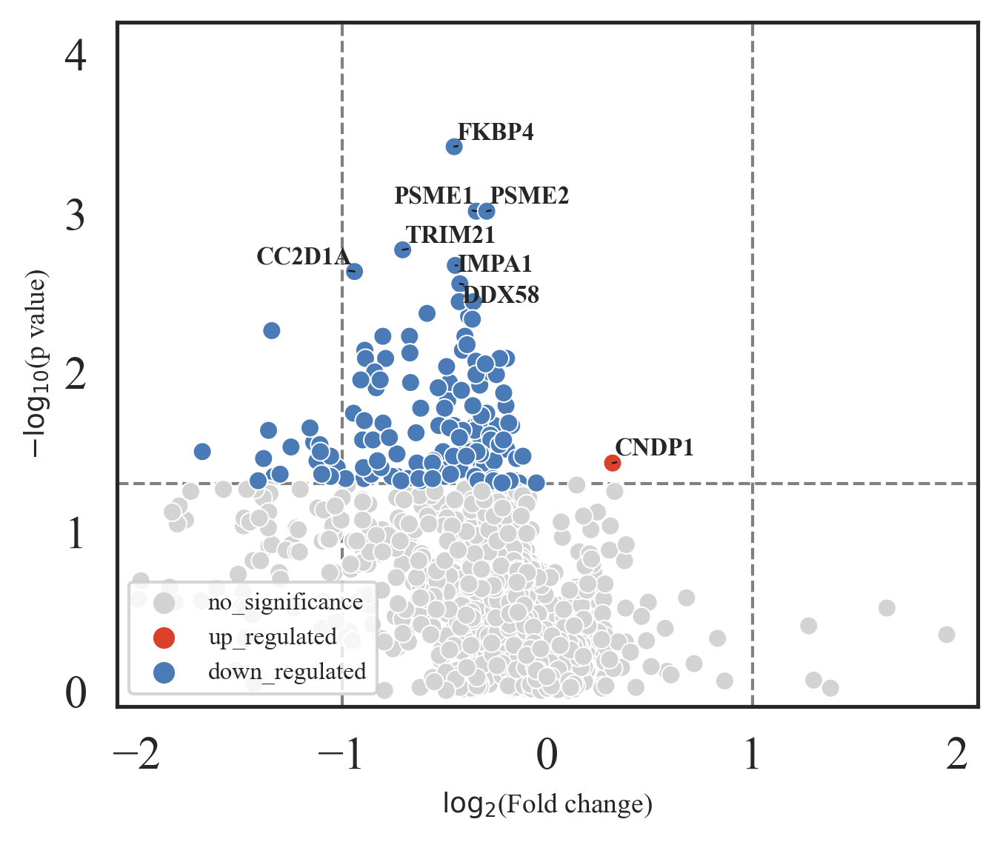

In [33]:
df_Proteomics_Compare = pd.DataFrame()
df_Proteomics_Compare['Gene_name'] = Gene_short

log2FC = []
stat = []
pvals = []

for item in Gene_name:
    log2FC.append(np.log2(np.average(2**df_Proteomics_High[item]))-np.log2(np.average(2**df_Proteomics_Medium[item])))
    t, p = stats.kruskal(2**df_Proteomics_High[item], 2**df_Proteomics_Medium[item])
    stat.append(t)
    pvals.append(p)

df_Proteomics_Compare['log2FC'] = log2FC
df_Proteomics_Compare['stat'] = stat
df_Proteomics_Compare['pvalue'] = pvals

for i in range(len(df_Proteomics_Compare)):
    df_Proteomics_Compare.loc[i, 'nlog10'] = -np.log10(df_Proteomics_Compare.loc[i, 'pvalue'])
    if df_Proteomics_Compare.loc[i, 'pvalue']>=0.05:
        df_Proteomics_Compare.loc[i, 'property'] = 'no_significance'
    elif df_Proteomics_Compare.loc[i, 'pvalue']<0.05 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        df_Proteomics_Compare.loc[i, 'property'] = 'down_regulated'
    else:
        df_Proteomics_Compare.loc[i, 'property'] = 'up_regulated'
        
ax = sns.scatterplot(data = df_Proteomics_Compare, x = 'log2FC', y = 'nlog10', hue = 'property', 
                     hue_order = ['no_significance', 'up_regulated', 'down_regulated'],
                    palette = ['lightgrey', '#D9412B', '#4A7BB7'])

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(1, zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-1, zorder = 0, c = 'grey', lw = 1, ls = '--')
        

texts = []

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>2.5 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>1.3 and df_Proteomics_Compare.loc[i, 'log2FC']>0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:], fontsize=8)

plt.xlabel("$\mathrm{log}_{2}$(Fold change)")
plt.ylabel("$-\mathrm{log}_{10}$(p value)")

plt.xlim(-2.1, 2.1)
plt.ylim(-0.1, 4.2)
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [34]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 2.xlsx", engine='openpyxl', mode='a') as writer:
#     df_Proteomics_Compare.to_excel(writer, sheet_name='High_vs_Medium', index=False)

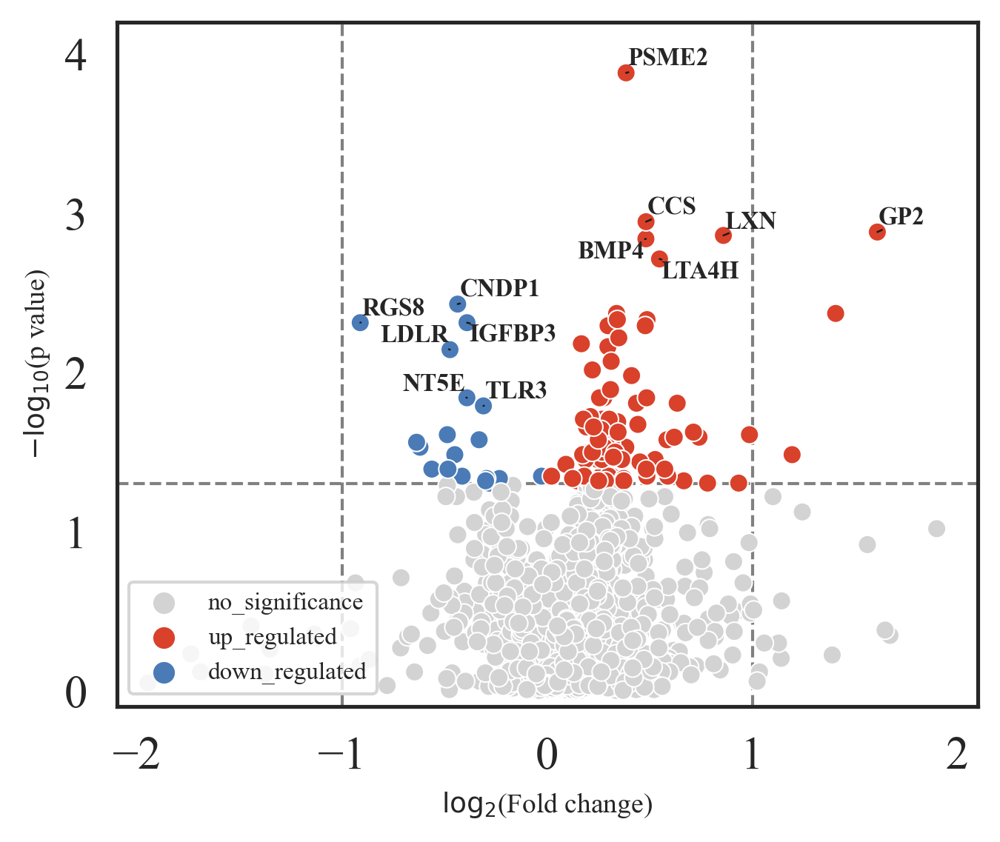

In [35]:
df_Proteomics_Compare = pd.DataFrame()
df_Proteomics_Compare['Gene_name'] = Gene_short

log2FC = []
stat = []
pvals = []

for item in Gene_name:
    log2FC.append(np.log2(np.average(2**df_Proteomics_Medium[item]))-np.log2(np.average(2**df_Proteomics_Low[item])))
    t, p = stats.kruskal(2**df_Proteomics_Medium[item], 2**df_Proteomics_Low[item])
    stat.append(t)
    pvals.append(p)

df_Proteomics_Compare['log2FC'] = log2FC
df_Proteomics_Compare['stat'] = stat
df_Proteomics_Compare['pvalue'] = pvals

for i in range(len(df_Proteomics_Compare)):
    df_Proteomics_Compare.loc[i, 'nlog10'] = -np.log10(df_Proteomics_Compare.loc[i, 'pvalue'])
    if df_Proteomics_Compare.loc[i, 'pvalue']>=0.05:
        df_Proteomics_Compare.loc[i, 'property'] = 'no_significance'
    elif df_Proteomics_Compare.loc[i, 'pvalue']<0.05 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        df_Proteomics_Compare.loc[i, 'property'] = 'down_regulated'
    else:
        df_Proteomics_Compare.loc[i, 'property'] = 'up_regulated'
        
ax = sns.scatterplot(data = df_Proteomics_Compare, x = 'log2FC', y = 'nlog10', hue = 'property', 
                     hue_order = ['no_significance', 'up_regulated', 'down_regulated'],
                    palette = ['lightgrey', '#D9412B', '#4A7BB7'])

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(1, zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-1, zorder = 0, c = 'grey', lw = 1, ls = '--')
        

texts = []

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>1.7 and df_Proteomics_Compare.loc[i, 'log2FC']<0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

for i in range(len(df_Proteomics_Compare)):
    if df_Proteomics_Compare.loc[i, 'nlog10']>2.5 and df_Proteomics_Compare.loc[i, 'log2FC']>0:
        texts.append(plt.text(x = df_Proteomics_Compare.loc[i, 'log2FC'], y = df_Proteomics_Compare.loc[i, 'nlog10'], s = df_Proteomics_Compare.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:], fontsize=8)

plt.xlabel("$\mathrm{log}_{2}$(Fold change)")
plt.ylabel("$-\mathrm{log}_{10}$(p value)")

plt.xlim(-2.1, 2.1)
plt.ylim(-0.1, 4.2)
plt.show()

# df3 = df_compare

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [36]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 2.xlsx", engine='openpyxl', mode='a') as writer:
#     df_Proteomics_Compare.to_excel(writer, sheet_name='Medium_vs_Low', index=False)

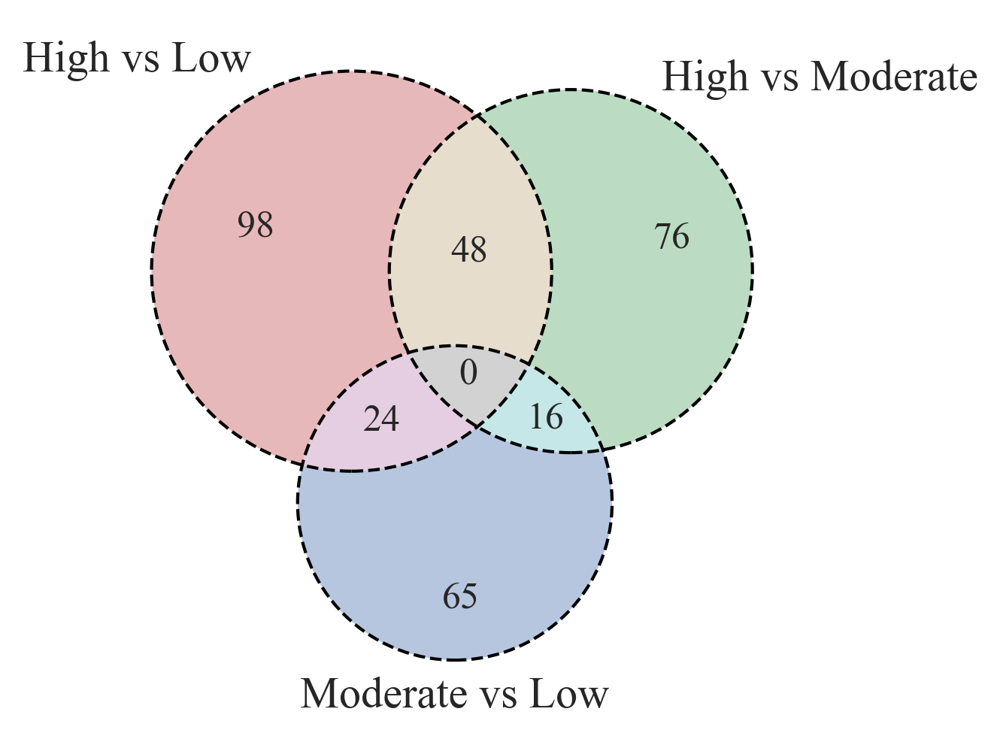

In [37]:
df_Proteomics_High_vs_Low = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='High_vs_Low')
df_Proteomics_High_vs_Medium = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='High_vs_Medium')
df_Proteomics_Medium_vs_Low = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='Medium_vs_Low')

df_Proteomics_High_vs_Low = df_Proteomics_High_vs_Low[df_Proteomics_High_vs_Low['property']!='no_significance']
df_Proteomics_High_vs_Medium = df_Proteomics_High_vs_Medium[df_Proteomics_High_vs_Medium['property']!='no_significance']
df_Proteomics_Medium_vs_Low = df_Proteomics_Medium_vs_Low[df_Proteomics_Medium_vs_Low['property']!='no_significance']

set1 = set(df_Proteomics_High_vs_Low.Gene_name)
set2 = set(df_Proteomics_High_vs_Medium.Gene_name)
set3 = set(df_Proteomics_Medium_vs_Low.Gene_name)

plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"

venn_input = (len(set1-set2-set3), 
              len(set2-set1-set3), 
              len(set.intersection(set1, set2)-set3), 
              len(set3-set1-set2), 
              len(set.intersection(set1, set3)-set2), 
              len(set.intersection(set2, set3)-set1), 
              len(set.intersection(set1, set2, set3)))

v = venn3(subsets=venn_input, set_labels = ('High vs Low', 'High vs Moderate', 'Moderate vs Low'))
c = venn3_circles(subsets=venn_input, linestyle='dashed', linewidth = 1.0)

for text in v.set_labels:
    text.set_fontsize(14)
for text in v.subset_labels:
    text.set_fontsize(12)
    
plt.show()

In [38]:
df = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='Proteomics_v1')
base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_imputed')
df_save = pd.DataFrame()

temp = list(df.columns)
for gene in temp:
    df = df.rename(columns={gene: gene.split('-')[0]})
# create a boolean mask for duplicate columns
duplicate_columns = df.columns.value_counts()[df.columns.value_counts() > 1].index
# drop the duplicate columns using the boolean mask
df = df.drop(columns=duplicate_columns)

i = 0
for gene in list(df.columns)[2:]:
    df_save.loc[i, 'Gene_name'] = list(df.columns)[2:][i%(df.shape[1]-2)]
    r, p = stats.spearmanr(base_info['ADAS-COG'], df[gene])
    df_save.loc[i, 'Correlation'] = r
    df_save.loc[i, 'pval'] = p
    df_save.loc[i, 'nlog10pval'] = -np.log10(df_save.loc[i, 'pval'])
    df_save.loc[i, 'feature'] = 'ADAS-COG'
    i = i+1

for gene in list(df.columns)[2:]:
    df_save.loc[i, 'Gene_name'] = list(df.columns)[2:][i%(df.shape[1]-2)]
    r, p = stats.spearmanr(base_info['Age'], df[gene])
    df_save.loc[i, 'Correlation'] = r
    df_save.loc[i, 'pval'] = p
    df_save.loc[i, 'nlog10pval'] = -np.log10(df_save.loc[i, 'pval'])
    df_save.loc[i, 'feature'] = 'Age'
    i = i+1

for gene in list(df.columns)[2:]:
    df_save.loc[i, 'Gene_name'] = list(df.columns)[2:][i%(df.shape[1]-2)]
    r, p = stats.spearmanr(base_info['BMI'], df[gene])
    df_save.loc[i, 'Correlation'] = r
    df_save.loc[i, 'pval'] = p
    df_save.loc[i, 'nlog10pval'] = -np.log10(df_save.loc[i, 'pval'])
    df_save.loc[i, 'feature'] = 'BMI'
    i = i+1
    
for gene in list(df.columns)[2:]:
    df_save.loc[i, 'Gene_name'] = list(df.columns)[2:][i%(df.shape[1]-2)]
    r, p = stats.spearmanr(base_info['SEX'], df[gene])
    df_save.loc[i, 'Correlation'] = r
    df_save.loc[i, 'pval'] = p
    df_save.loc[i, 'nlog10pval'] = -np.log10(df_save.loc[i, 'pval'])
    df_save.loc[i, 'feature'] = 'SEX'
    i = i+1

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [39]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 2.xlsx", engine='openpyxl', mode='a') as writer:
#     df_save.to_excel(writer, sheet_name='Prot_vs_ADAS', index=False)

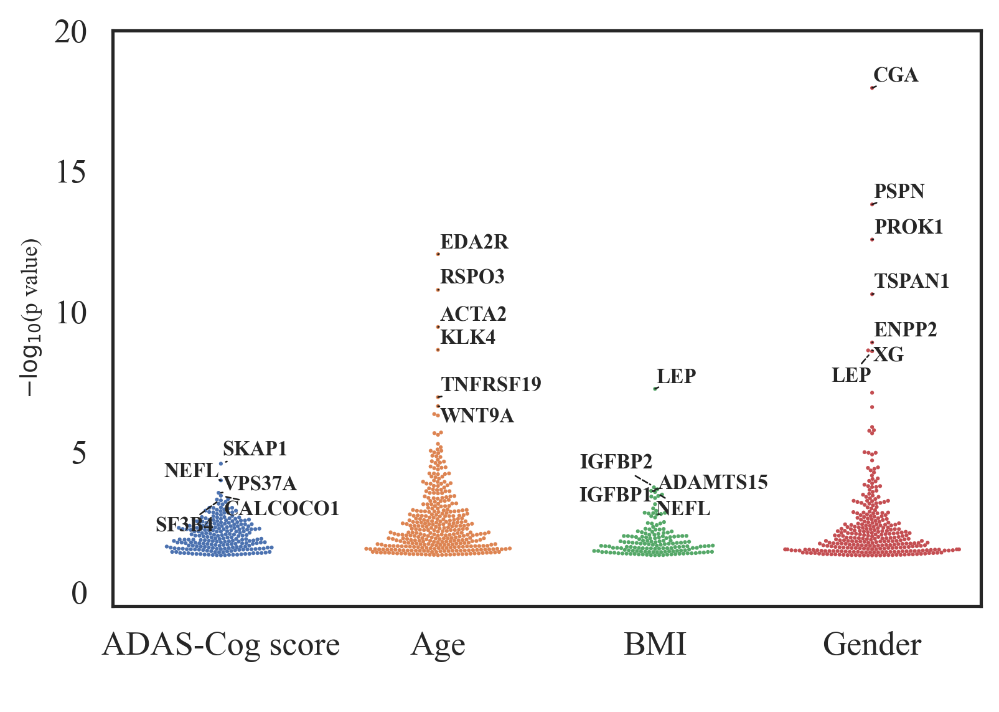

In [40]:
# replace the values in the 'feature' column
df_save['feature'] = df_save['feature'].replace({'ADAS-COG': 'ADAS-Cog score', 'SEX': 'Gender'})

plt.rcParams['figure.figsize'] = [6.0, 4.0]
plt.rcParams['xtick.labelsize'] = 13
plt.rcParams['ytick.labelsize'] = 13

ax = sns.swarmplot(data=df_save[df_save['pval']<0.05], x="feature", y="nlog10pval", size=1.5)

texts = []

for i in range(len(df_save)):
    if df_save.loc[i, 'feature']=='ADAS-Cog score' and df_save.loc[i, 'nlog10pval']>3.3:
        texts.append(plt.text(x = 0, y = df_save.loc[i, 'nlog10pval'], s = df_save.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))
    if df_save.loc[i, 'feature']=='Age' and df_save.loc[i, 'nlog10pval']>6.5:
        texts.append(plt.text(x = 1, y = df_save.loc[i, 'nlog10pval'], s = df_save.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))
    if df_save.loc[i, 'feature']=='BMI' and df_save.loc[i, 'nlog10pval']>3.5:
        texts.append(plt.text(x = 2, y = df_save.loc[i, 'nlog10pval'], s = df_save.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))
    if df_save.loc[i, 'feature']=='Gender' and df_save.loc[i, 'nlog10pval']>8:
        texts.append(plt.text(x = 3, y = df_save.loc[i, 'nlog10pval'], s = df_save.loc[i, 'Gene_name'], fontsize = 8, weight = 'bold'))

adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

plt.ylim(-0.5, 20)
plt.xlabel(' ')
plt.ylabel("$-\mathrm{log}_{10}$(p value)")

plt.show()

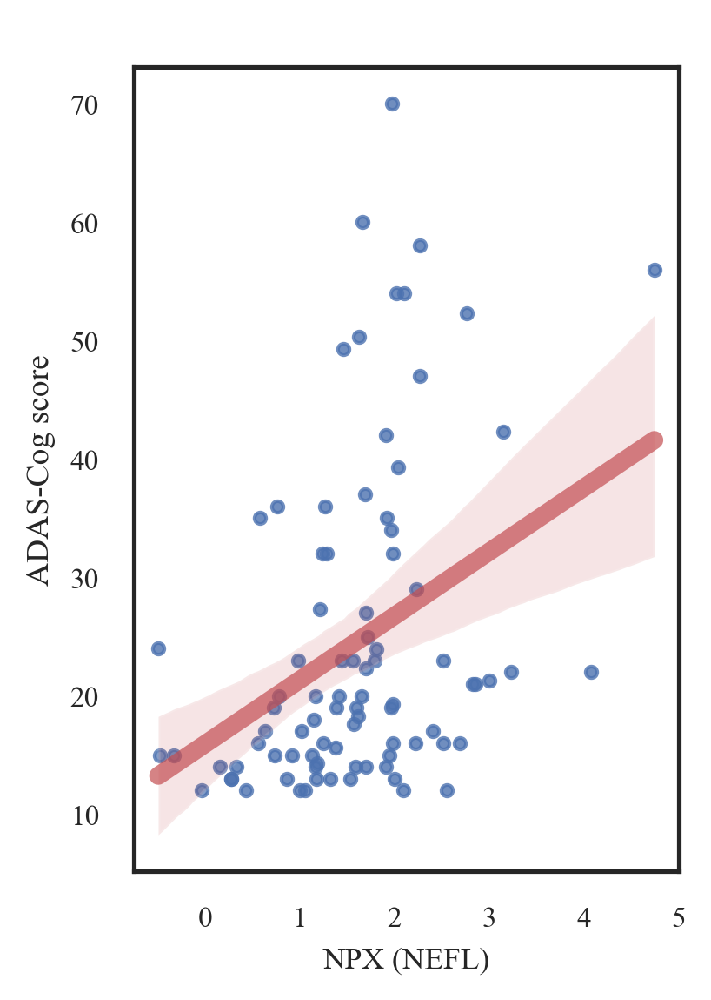

In [41]:
plt.rcParams['figure.figsize'] = [2.7, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

sns.regplot(x=df['NEFL'], y=base_info['ADAS-COG'], line_kws={"color":"r","alpha":0.7,"lw":5}, scatter_kws={'s': 10})
plt.xlabel('NPX (NEFL)', fontsize=8.5)
plt.ylabel('ADAS-Cog score', fontsize=9)
plt.title(' ', fontsize=8)
plt.show()

In [42]:
xlsx = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name=None)

df_lst = xlsx['Prot_vs_ADAS']
top_lst = list(df_lst[df_lst['feature']=='ADAS-COG'].sort_values(by='pval')['Gene_name'])[:45]

df1 = xlsx['High_vs_Medium']
temp1 = df1[['Gene_name', 'log2FC', 'pvalue']].rename(columns={"log2FC": "High vs Moderate", "pvalue": "pvalue_1"})
df2 = xlsx['High_vs_Low']
temp2 = df2[['Gene_name', 'log2FC', 'pvalue']].rename(columns={"log2FC": "High vs Low", "pvalue": "pvalue_2"})
df3 = xlsx['Medium_vs_Low']
temp3 = df3[['Gene_name', 'log2FC', 'pvalue']].rename(columns={"log2FC": "Moderate vs Low", "pvalue": "pvalue_3"})

df = temp1.merge(temp2, on='Gene_name')
df = df.merge(temp3, on='Gene_name')
df = df[df['Gene_name'].isin(top_lst)].reset_index(drop=True)

df_plot = df[['Gene_name', 'High vs Moderate', 'High vs Low', 'Moderate vs Low']]
df_plot = df_plot.set_index('Gene_name').T

df_text = df[['Gene_name', 'pvalue_1', 'pvalue_2', 'pvalue_3']]
df_text = df_text.set_index('Gene_name').T
for i in range(df_text.shape[0]):
    for j in range(df_text.shape[1]):
        if df_text.iloc[i,j] < 0.05:
            df_text.iloc[i,j] ='*'
        else:
            df_text.iloc[i,j] =' '

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [43]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 2.xlsx", engine='openpyxl', mode='a') as writer:
#     df_plot.to_excel(writer, sheet_name='Top_Differential_Proteins')

In [44]:
plt.rcParams['xtick.labelsize'] = 40
plt.rcParams['ytick.labelsize'] = 40
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 40})

sns.clustermap(df_plot.reindex(['High vs Low', 'High vs Moderate', 'Moderate vs Low']), annot=df_text.reindex(['pvalue_2', 'pvalue_1', 'pvalue_3']), fmt="", figsize=(80, 10), row_cluster=False, cmap=cmap, cbar_pos=(1, 0.8, 0.05, 0.18), dendrogram_ratio=0.5, center=0, cbar_kws={"ticks":[-0.5, 0, 0.5]}, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
# plt.savefig('foo.png', dpi=300)
plt.show()

In [45]:
df_Proteomics = pd.read_excel('../AD baseline/Supplementary Table 2.xlsx', sheet_name='Proteomics_v1')
df4 = df_Clinic.iloc[:,:2].merge(df_Proteomics, on='Patient ID')

for item in list(df4.columns):
    df4 = df4.rename(columns={item: item.split('-')[0]})

def filter(df, item, lr=0.25, hr=0.75):
    lv = df[item].quantile(lr)
    hv = df[item].quantile(hr)
    iqr = hv - lv
    lower_bound = lv - (1.5 * iqr)
    upper_bound = hv + (1.5 * iqr)
    filtered_df = df[(df[item] >= lower_bound) & (df[item] <= upper_bound)]
    return filtered_df

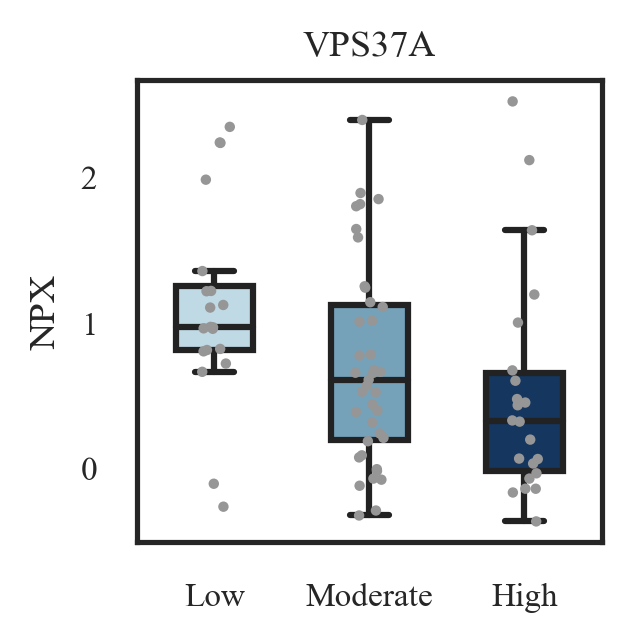

In [46]:
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams.update({'font.size': 7})
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

ax = sns.boxplot(x=filter(df4, 'VPS37A')["ADAS group"], y=filter(df4, 'VPS37A')['VPS37A'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], order=['Low', 'Medium', 'High'], width=0.5, saturation=1, showfliers=False)
sns.stripplot(x=filter(df4, 'VPS37A')["ADAS group"], y=filter(df4, 'VPS37A')['VPS37A'], palette = ['#969696'], order=['Low', 'Medium', 'High'], size=2.5)
plt.xlabel("")
plt.ylabel("NPX")
plt.title("VPS37A")

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['Low', 'Moderate', 'High'])
plt.show()

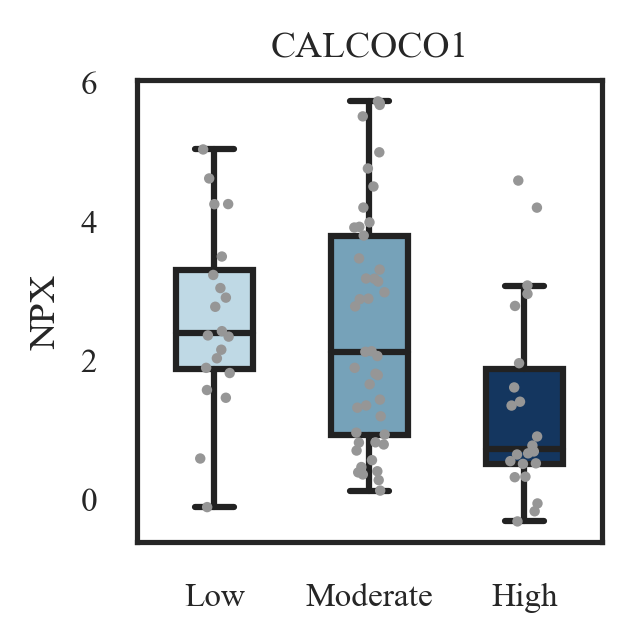

In [47]:
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams.update({'font.size': 7})
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

ax = sns.boxplot(x=filter(df4, 'CALCOCO1')["ADAS group"], y=filter(df4, 'CALCOCO1')['CALCOCO1'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], order=['Low', 'Medium', 'High'], width=0.5, saturation=1, showfliers=False)
sns.stripplot(x=filter(df4, 'CALCOCO1')["ADAS group"], y=filter(df4, 'CALCOCO1')['CALCOCO1'], palette = ['#969696'], order=['Low', 'Medium', 'High'], size=2.5)
plt.xlabel("")
plt.ylabel("NPX")
plt.title("CALCOCO1")

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['Low', 'Moderate', 'High'])

plt.show()

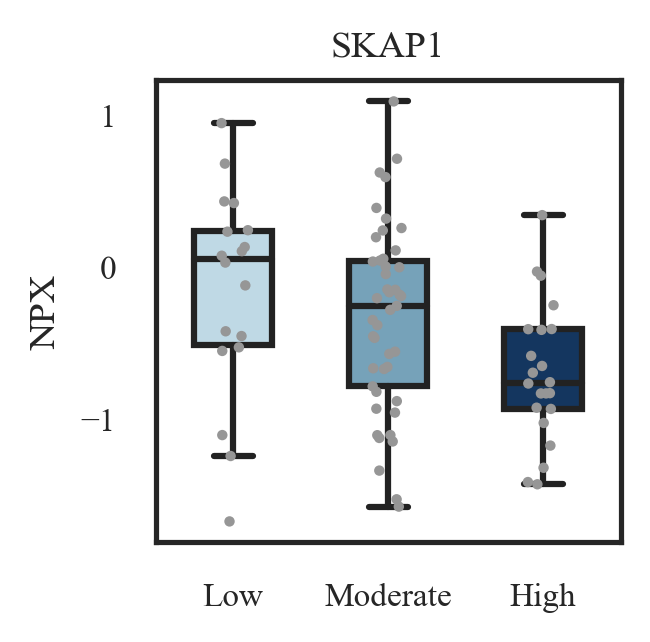

In [48]:
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams.update({'font.size': 7})
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

ax = sns.boxplot(x=filter(df4, 'SKAP1')["ADAS group"], y=filter(df4, 'SKAP1')['SKAP1'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], order=['Low', 'Medium', 'High'], width=0.5, saturation=1, showfliers=False)
sns.stripplot(x=filter(df4, 'SKAP1')["ADAS group"], y=filter(df4, 'SKAP1')['SKAP1'], palette = ['#969696'], order=['Low', 'Medium', 'High'], size=2.5)
plt.xlabel("")
plt.ylabel("NPX")
plt.title("SKAP1")

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['Low', 'Moderate', 'High'])

plt.show()

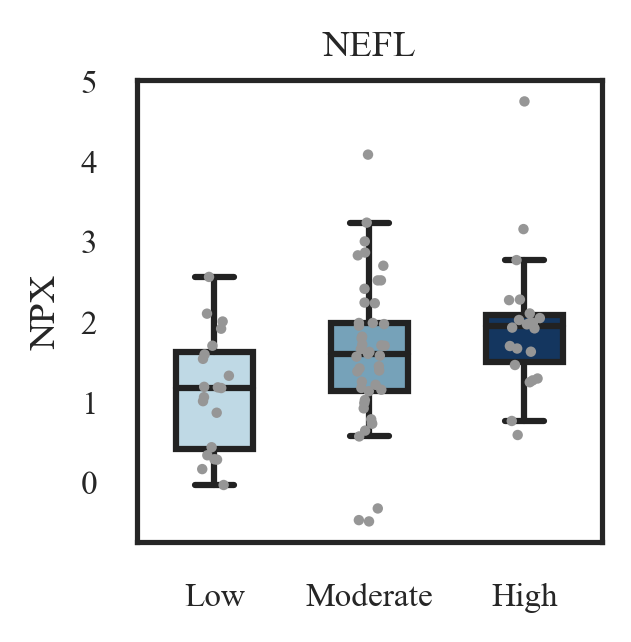

In [49]:
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams.update({'font.size': 7})
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

ax = sns.boxplot(x=df4["ADAS group"], y=df4['NEFL'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], order=['Low', 'Medium', 'High'], width=0.5, saturation=1, showfliers=False)
sns.stripplot(x=df4["ADAS group"], y=df4['NEFL'], palette = ['#969696'], order=['Low', 'Medium', 'High'], size=2.5)
plt.xlabel("")
plt.ylabel("NPX")
plt.title("NEFL")

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['Low', 'Moderate', 'High'])

plt.show()

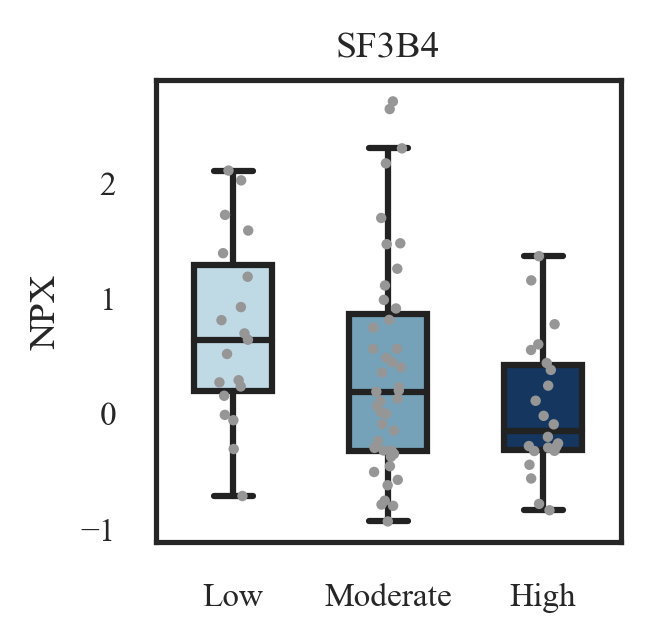

In [50]:
plt.rcParams['figure.figsize'] = [2, 2]
plt.rcParams.update({'font.size': 7})
plt.rcParams['xtick.labelsize'] = 8
plt.rcParams['ytick.labelsize'] = 8

ax = sns.boxplot(x=filter(df4, 'SF3B4')["ADAS group"], y=filter(df4, 'SF3B4')['SF3B4'], palette = ['#BFD9E5', '#76A2B9', '#14365F'], order=['Low', 'Medium', 'High'], width=0.5, saturation=1, showfliers=False)
sns.stripplot(x=filter(df4, 'SF3B4')["ADAS group"], y=filter(df4, 'SF3B4')['SF3B4'], palette = ['#969696'], order=['Low', 'Medium', 'High'], size=2.5)
plt.xlabel("")
plt.ylabel("NPX")
plt.title("SF3B4")

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['Low', 'Moderate', 'High'])

plt.show()

## Figure 3 - Metabolomics analysis

In [51]:
df_Clinic = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name = 'Clinic_v1_imputed')
df_Metabolomics = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'Metabolomics_v1')
df_Metabolomics = df_Clinic.iloc[:,:2].merge(df_Metabolomics, on='Patient ID')

for i in list(range(1,len(df_Metabolomics)//2)):
    for col in list(df_Metabolomics.columns)[3:]:
        if len(df_Metabolomics[col].unique()) == i:
            df_Metabolomics.drop(col,inplace=True,axis=1)
            
high_vs_low = []
high_vs_medium = []
medium_vs_low = []
high_vs_low_pval = []
high_vs_medium_pval = []
medium_vs_low_pval = []

arr1 = list(df_Metabolomics.columns)
arr1.remove('Patient ID')
arr1.remove('ADAS group')

for item in arr1:
    s, p = stats.kruskal(df_Metabolomics[df_Metabolomics['ADAS group'] == 'High'][item], df_Metabolomics[df_Metabolomics['ADAS group'] == 'Medium'][item])
    if p<0.05:
        high_vs_medium.append(item)
        high_vs_medium_pval.append(p)
        
for item in arr1:
    s, p = stats.kruskal(df_Metabolomics[df_Metabolomics['ADAS group'] == 'High'][item], df_Metabolomics[df_Metabolomics['ADAS group'] == 'Low'][item])
    if p<0.05:
        high_vs_low.append(item)
        high_vs_low_pval.append(p)
        
for item in arr1:
    s, p = stats.kruskal(df_Metabolomics[df_Metabolomics['ADAS group'] == 'Medium'][item], df_Metabolomics[df_Metabolomics['ADAS group'] == 'Low'][item])
    if p<0.05:
        medium_vs_low.append(item)
        medium_vs_low_pval.append(p)

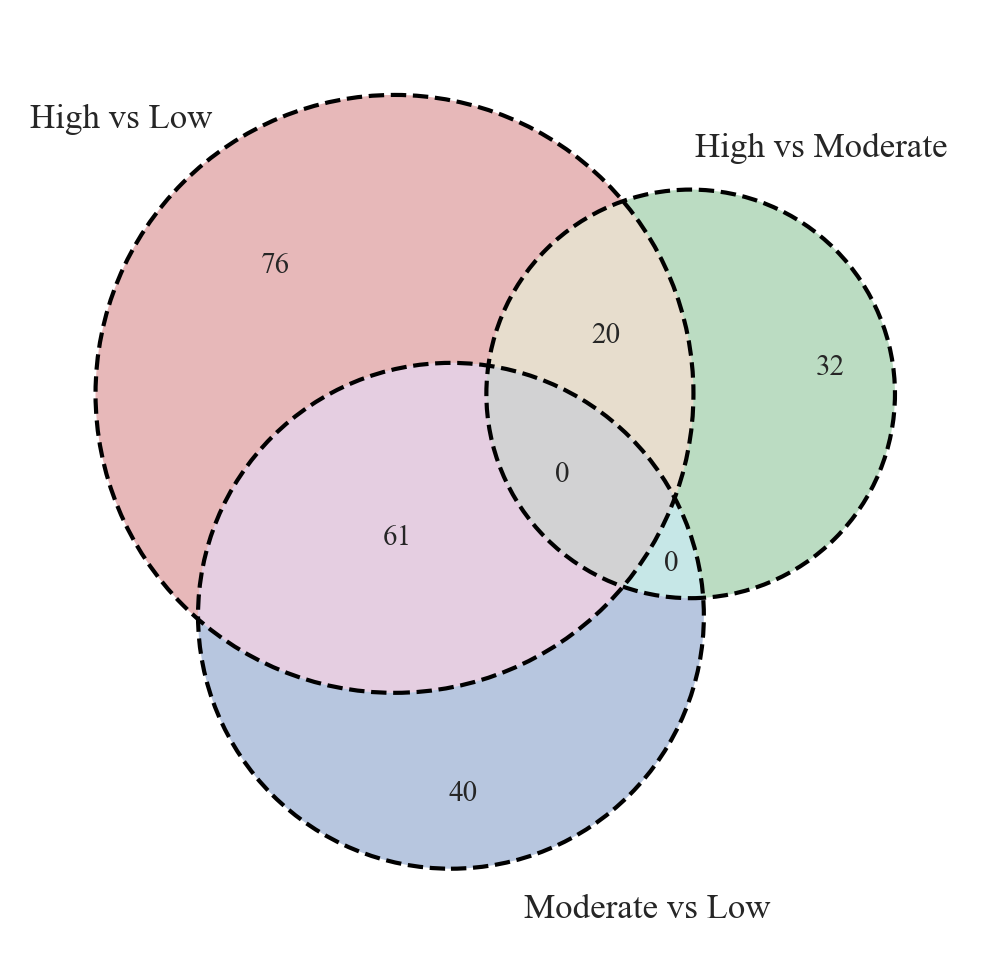

In [52]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"

venn_input = (len(set(high_vs_low)-set(high_vs_medium)-set(medium_vs_low))+10, 
              len(set(high_vs_medium)-set(high_vs_low)-set(medium_vs_low))+10, 
              len(set.intersection(set(high_vs_low), set(high_vs_medium))-set(medium_vs_low))+10, 
              len(set(medium_vs_low)-set(high_vs_low)-set(high_vs_medium))+10, 
              len(set.intersection(set(high_vs_low), set(medium_vs_low))-set(high_vs_medium))+10, 
              len(set.intersection(set(high_vs_medium), set(medium_vs_low))-set(high_vs_low))+10, 
              len(set.intersection(set(high_vs_low), set(high_vs_medium), set(medium_vs_low)))+10)

v = venn3(subsets=venn_input, set_labels = ('High vs Low', 'High vs Moderate', 'Moderate vs Low'), subset_label_formatter=lambda x: x-10)

c = venn3_circles(subsets=venn_input, linestyle='dashed', linewidth = 1.0)

lbl = v.get_label_by_id("A")
x, y = lbl.get_position()
lbl.set_position((x-0.05, y-0.05))
lbl = v.get_label_by_id("B")
x, y = lbl.get_position()
lbl.set_position((x-0.15, y+0.05))
lbl = v.get_label_by_id("C")
x, y = lbl.get_position()
lbl.set_position((x+0.3, y))  # Or whatever

plt.show()

In [53]:
specific = list(set.union(set(high_vs_low), set(medium_vs_low), set(high_vs_medium)))
temp = df_Metabolomics[['ADAS group']+specific]

X = np.zeros((len(specific), 3))
i = 0
for item in specific:
    X[i, 0] = np.log2(np.average(temp[temp['ADAS group']=='High'][item])) - np.log2(np.average(temp[temp['ADAS group']=='Medium'][item]))
    X[i, 1] = np.log2(np.average(temp[temp['ADAS group']=='High'][item])) - np.log2(np.average(temp[temp['ADAS group']=='Low'][item]))
    X[i, 2] = np.log2(np.average(temp[temp['ADAS group']=='Medium'][item])) - np.log2(np.average(temp[temp['ADAS group']=='Low'][item]))
    i = i+1
    
output = pd.DataFrame(X, columns=['High vs Moderate', 'High vs Low', 'Moderate vs Low'])
temp1 = pd.DataFrame(specific, columns=['Metabolites'])
output = pd.concat([temp1, output], axis=1)
annotation = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'Chemical Annotation')

list2 = list(annotation['CHEMICAL_NAME'])
list3 = list(annotation['SUB_PATHWAY'])
list4 = list(annotation['SUPER_PATHWAY'])

def pathway(n):
    return list3[list2.index(n)]
def superpathway(n):
    return list4[list2.index(n)]

output = pd.concat([output, pd.DataFrame(list(map(pathway, output['Metabolites'])), columns=['pathway'])], axis=1)
output = pd.concat([output, pd.DataFrame(list(map(superpathway, output['Metabolites'])), columns=['superpathway'])], axis=1)

for i in range(len(output)):
    if output.loc[i, 'Metabolites'] in high_vs_medium:
        output.loc[i, 'sig_high_vs_medium'] = '*'
        output.loc[i, 'high_vs_medium_pval'] = high_vs_medium_pval[high_vs_medium.index(output.loc[i, 'Metabolites'])]
    else:
        output.loc[i, 'sig_high_vs_medium'] = ' '
        output.loc[i, 'high_vs_medium_pval'] = '>0.05'
    if output.loc[i, 'Metabolites'] in high_vs_low:
        output.loc[i, 'sig_high_vs_low'] = '*'
        output.loc[i, 'high_vs_low_pval'] = high_vs_low_pval[high_vs_low.index(output.loc[i, 'Metabolites'])]
    else:
        output.loc[i, 'sig_high_vs_low'] = ' '
        output.loc[i, 'high_vs_low_pval'] = '>0.05'
    if output.loc[i, 'Metabolites'] in medium_vs_low:
        output.loc[i, 'sig_medium_vs_low'] = '*'
        output.loc[i, 'medium_vs_low_pval'] = medium_vs_low_pval[medium_vs_low.index(output.loc[i, 'Metabolites'])]
    else:
        output.loc[i, 'sig_medium_vs_low'] = ' '
        output.loc[i, 'medium_vs_low_pval'] = '>0.05'

In [54]:
select_row = []
for i in range(len(output)):
    if output.loc[i, 'sig_high_vs_low']=='*' and output.loc[i, 'sig_medium_vs_low']=='*':
        select_row.append(i)
Low_specific = output.iloc[select_row, :]
Low_specific = Low_specific.reset_index(drop=True)

select_row = []
for i in range(len(output)):
    if output.loc[i, 'sig_high_vs_medium']=='*' and output.loc[i, 'sig_medium_vs_low']=='*':
        select_row.append(i)
Moderate_specific = output.iloc[select_row, :]
Moderate_specific = Moderate_specific.reset_index(drop=True)

select_row = []
for i in range(len(output)):
    if output.loc[i, 'sig_high_vs_medium']=='*' and output.loc[i, 'sig_high_vs_low']=='*':
        select_row.append(i)
High_specific = output.iloc[select_row, :]
High_specific = High_specific.reset_index(drop=True)

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [55]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 3.xlsx", engine='openpyxl', mode='a') as writer:
#     output.to_excel(writer, index=False, sheet_name='all_significance')
#     Low_specific.to_excel(writer, index=False, sheet_name='Low_specific')
#     Moderate_specific.to_excel(writer, index=False, sheet_name='Moderate_specific')
#     High_specific.to_excel(writer, index=False, sheet_name='High_specific')

In [56]:
df = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'Metabolomics_v1')
df_clin = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name = 'Clinic_v1_raw')
ADAS_Cog = list(df_clin['ADAS-COG'])

for i in list(range(1,len(df)//2)):
    for col in list(df.columns)[1:]:
        if len(df[col].unique()) == i:
            df.drop(col,inplace=True,axis=1)

df_save = pd.DataFrame()
i = 0
for meta in list(df.columns)[1:]:
    df_save.loc[i, 'CHEMICAL_NAME'] = list(df.columns)[1:][i%(df.shape[1]-1)]
    r, p = stats.spearmanr(ADAS_Cog, df[meta])
    df_save.loc[i, 'Correlation'] = r
    df_save.loc[i, 'pval'] = p
    df_save.loc[i, 'nlog10pval'] = -np.log10(df_save.loc[i, 'pval'])
    if list(annotation[annotation['CHEMICAL_NAME']==meta]['SUPER_PATHWAY'])[0] in ['Amino Acid', 'Carbohydrate', 'Lipid', 'Xenobiotics']:
        df_save.loc[i, 'feature'] = list(annotation[annotation['CHEMICAL_NAME']==meta]['SUPER_PATHWAY'])[0]
    else:
        df_save.loc[i, 'feature'] = 'Others'
    i = i+1
    
df_save = df_save.sort_values(by=['pval'], ignore_index=True)

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [57]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 3.xlsx", engine='openpyxl', mode='a') as writer:
#     df_save.to_excel(writer, sheet_name='Meta_vs_ADAS', index=False)

In [58]:
df = df_clin.iloc[:,:2].merge(df, on='Patient ID')
df_high = df[df['ADAS group']=='High'].iloc[:, 2:]
df_low = df[df['ADAS group']=='Low'].iloc[:, 2:]

In [59]:
df_valcano = pd.DataFrame()
for i in range(0, df_low.shape[1]):
    df_valcano.loc[i, 'Name'] = df_low.columns[i]
    temp1, temp2 = stats.kruskal(df_low.iloc[:, i], df_high.iloc[:, i])
    df_valcano.loc[i, 'stat'] = temp1
    df_valcano.loc[i, 'pval'] = temp2
    df_valcano.loc[i, 'nlog10pval'] = -np.log10(temp2)
    df_valcano.loc[i, 'log2FC'] = np.log2(np.average(df_high.iloc[:, i])) - np.log2(np.average(df_low.iloc[:, i]))
    if df_valcano.loc[i, 'pval'] >= 0.05:
        df_valcano.loc[i, 'property'] = 'no_significance'
    elif df_valcano.loc[i, 'pval'] < 0.05 and df_valcano.loc[i, 'log2FC']<0:
        df_valcano.loc[i, 'property'] = 'down_regulated'
    else:
        df_valcano.loc[i, 'property'] = 'up_regulated'

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [60]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 3.xlsx", engine='openpyxl', mode='a') as writer:
#     df_valcano.to_excel(writer, sheet_name='Valcano_plot', index=False)

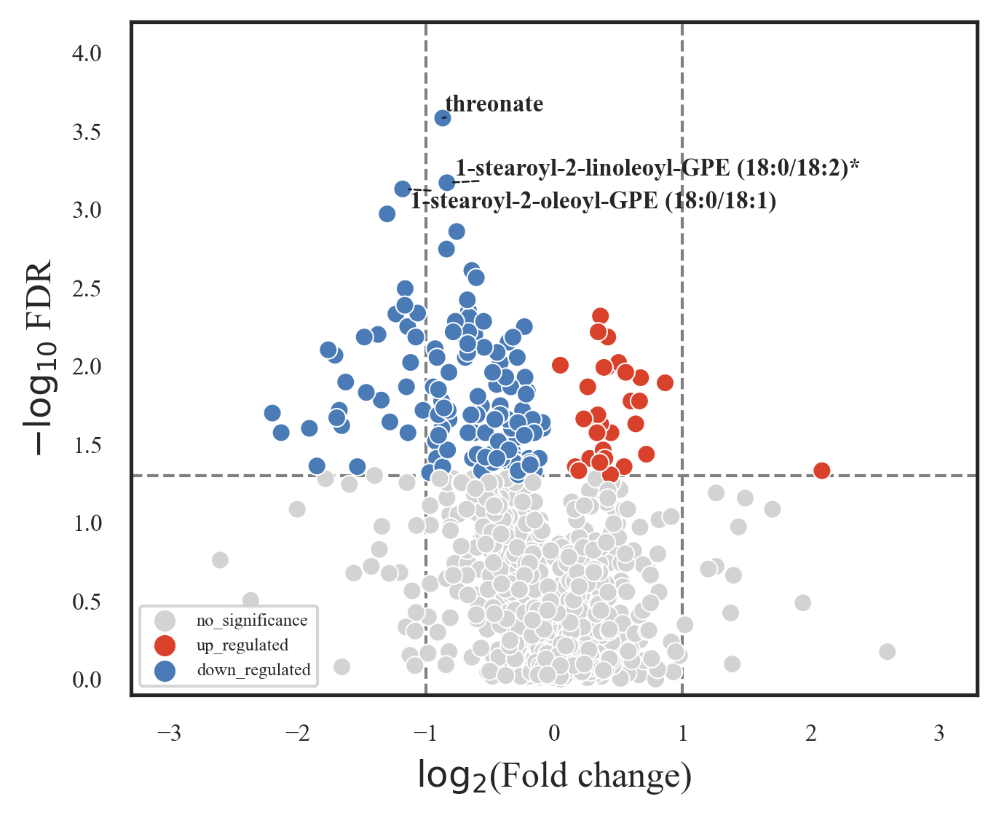

In [61]:
plt.rcParams['figure.figsize'] = [5.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower left'
plt.rcParams['legend.fontsize'] = 'small'


ax = sns.scatterplot(data = df_valcano, x = 'log2FC', y = 'nlog10pval', hue = 'property', 
                     hue_order = ['no_significance', 'up_regulated', 'down_regulated'],
                    palette = ['lightgrey', '#D9412B', '#4A7BB7'])

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(1, zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-1, zorder = 0, c = 'grey', lw = 1, ls = '--')
        

texts = []

for i in range(len(df_valcano)):
    if df_valcano.loc[i, 'nlog10pval']>3 and df_valcano.loc[i, 'log2FC']<0:
        texts.append(plt.text(x = df_valcano.loc[i, 'log2FC'], y = df_valcano.loc[i, 'nlog10pval'], s = df_valcano.loc[i, 'Name'], fontsize = 8, weight = 'bold'))

for i in range(len(df_valcano)):
    if df_valcano.loc[i, 'nlog10pval']>3.1 and df_valcano.loc[i, 'log2FC']>0:
        texts.append(plt.text(x = df_valcano.loc[i, 'log2FC'], y = df_valcano.loc[i, 'nlog10pval'], s = df_valcano.loc[i, 'Name'], fontsize = 8, weight = 'bold'))

adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

plt.xlabel("$\mathrm{log}_{2}$(Fold change)", size=12)
plt.ylabel("$-\mathrm{log}_{10}$ FDR", size=12)

plt.xlim(-3.3, 3.3)
plt.ylim(-0.1, 4.2)
plt.show()

In [62]:
df_diff = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'all_significance')
meta = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'Meta_vs_ADAS')
temp_amino_acid = list(meta[meta['feature']=='Amino Acid'].sort_values(by='pval')['CHEMICAL_NAME'])[:14]
temp_carbohydrate = list(meta[meta['feature']=='Carbohydrate'].sort_values(by='pval')['CHEMICAL_NAME'])[:4]
temp_lipid = list(meta[meta['feature']=='Lipid'].sort_values(by='pval')['CHEMICAL_NAME'])[:38]
temp_others = list(meta[meta['feature']=='Others'].sort_values(by='pval')['CHEMICAL_NAME'])[:3]
temp = list(annotation[(annotation['SUB_PATHWAY']=='Phosphatidylcholine (PC)')|(annotation['SUB_PATHWAY']=='Phosphatidylethanolamine (PE)')
           |(annotation['SUB_PATHWAY']=='Phosphatidylinositol (PI)')|(annotation['SUB_PATHWAY']=='Secondary Bile Acid Metabolism')
           |(annotation['SUB_PATHWAY']=='Dihydroceramides')|(annotation['SUB_PATHWAY']=='Diacylglycerol')]['CHEMICAL_NAME'])
temp_lipid = list(set.intersection(set(temp_lipid), set(temp)))
filter_lst = temp_amino_acid+temp_carbohydrate+temp_lipid+temp_others
filtered_diff = df_diff[df_diff['Metabolites'].isin(filter_lst)]

df_plot = filtered_diff[['Metabolites', 'High vs Low', 'High vs Moderate', 'Moderate vs Low']]
df_plot = df_plot.set_index('Metabolites').T

df_text = filtered_diff[['Metabolites', 'sig_high_vs_low', 'sig_high_vs_medium', 'sig_medium_vs_low']]
df_text = df_text.set_index('Metabolites').T

plt.rcParams['xtick.labelsize'] = 40
plt.rcParams['ytick.labelsize'] = 40
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 40})

sns.clustermap(df_plot, annot=df_text, fmt="", figsize=(80, 21), row_cluster=False, cmap=cmap, cbar_pos=(1, 0.8, 0.05, 0.18), dendrogram_ratio=0.5, center=0, cbar_kws={"ticks":[-0.5, 0, 0.5]}, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
# plt.savefig('foo.png', dpi=300)
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [63]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 3.xlsx", engine='openpyxl', mode='a') as writer:
#     df_plot.to_excel(writer, sheet_name='Top_Differential_Proteins', index=False)

In [64]:
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

hex_colors = ['#67001f','#b2182b','#d6604d','#f4a582','#fddbc7','#f7f7f7','#d1e5f0','#92c5de','#4393c3','#2166ac','#053061']
hex_colors.reverse()
rgb_colors = [colors.hex2color(h) for h in hex_colors]
cmap = colors.LinearSegmentedColormap.from_list('mycmap', rgb_colors, N=256)

df = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'all_significance')
df = df[df['sig_high_vs_low']=='*']
df = df[df['superpathway']=='Lipid']
df_plot = df[['Metabolites', 'High vs Moderate', 'High vs Low', 'Moderate vs Low']]
df_plot = df_plot.set_index('Metabolites')
df_text = df[['sig_high_vs_medium', 'sig_high_vs_low', 'sig_medium_vs_low']]

sns.clustermap(df_plot, annot=df_text, annot_kws={"size": 20, "ha": 'center',"va": 'center_baseline'}, fmt="", figsize=(10, 70), cmap=cmap, col_cluster=False, dendrogram_ratio=0.7, center=0, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
plt.show()

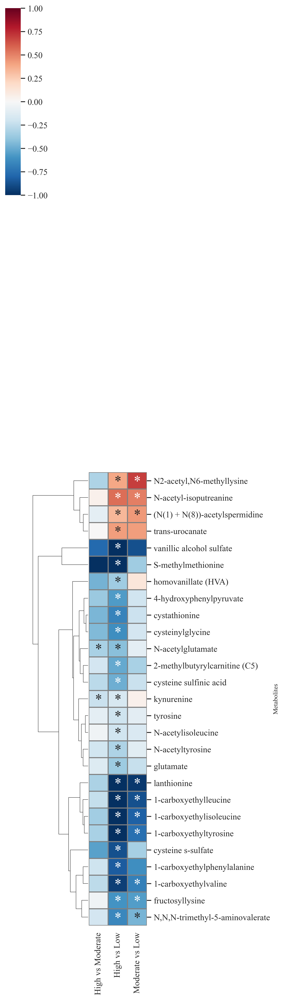

In [65]:
df = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'all_significance')
df = df[df['sig_high_vs_low']=='*']
df = df[df['superpathway']=='Amino Acid']
df_plot = df[['Metabolites', 'High vs Moderate', 'High vs Low', 'Moderate vs Low']]
df_plot = df_plot.set_index('Metabolites')
df_text = df[['sig_high_vs_medium', 'sig_high_vs_low', 'sig_medium_vs_low']]

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

sns.clustermap(df_plot, annot=df_text, annot_kws={"size": 20, "ha": 'center',"va": 'center_baseline'}, fmt="", figsize=(6, 20), cmap=cmap, col_cluster=False, dendrogram_ratio=0.5, center=0, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
plt.show()

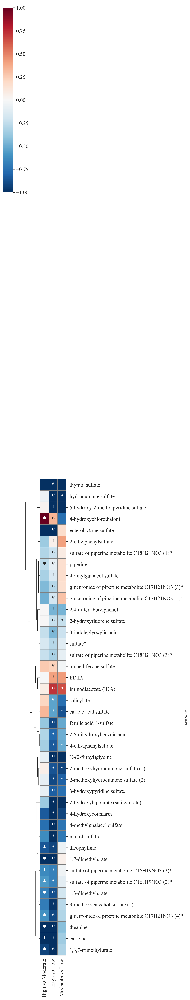

In [66]:
df = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'all_significance')
df = df[df['sig_high_vs_low']=='*']
df = df[df['superpathway']=='Xenobiotics']
df_plot = df[['Metabolites', 'High vs Moderate', 'High vs Low', 'Moderate vs Low']]
df_plot = df_plot.set_index('Metabolites')
df_text = df[['sig_high_vs_medium', 'sig_high_vs_low', 'sig_medium_vs_low']]

plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

sns.clustermap(df_plot, annot=df_text, annot_kws={"size": 20, "ha": 'center',"va": 'center_baseline'}, fmt="", figsize=(8, 40), cmap=cmap, col_cluster=False, dendrogram_ratio=0.5, center=0, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
plt.show()

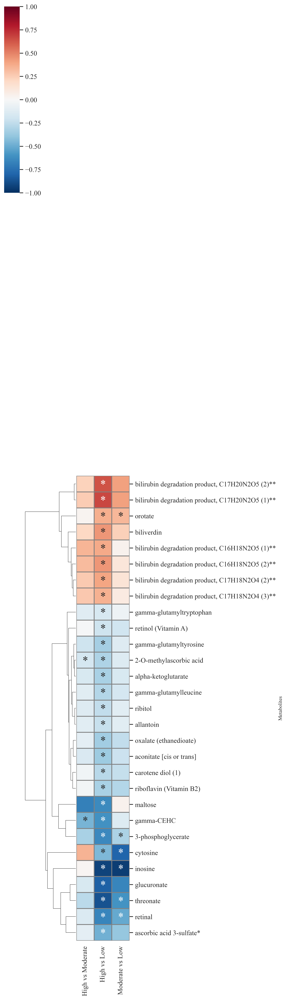

In [67]:
df = pd.read_excel('../AD baseline/Supplementary Table 3.xlsx', sheet_name = 'all_significance')
df = df[df['sig_high_vs_low']=='*']
df = df[(df['superpathway']!='Lipid')&(df['superpathway']!='Amino Acid')&(df['superpathway']!='Xenobiotics')]
df_plot = df[['Metabolites', 'High vs Moderate', 'High vs Low', 'Moderate vs Low']]
df_plot = df_plot.set_index('Metabolites')
df_text = df[['sig_high_vs_medium', 'sig_high_vs_low', 'sig_medium_vs_low']]

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

sns.clustermap(df_plot, annot=df_text, annot_kws={"size": 20, "ha": 'center',"va": 'center_baseline'}, fmt="", figsize=(7.5, 25), cmap=cmap, col_cluster=False, dendrogram_ratio=0.5, center=0, vmax=1, vmin=-1, linewidths=1, linecolor='grey')
plt.show()

## Figure 4 - Metagenomics analysis

In [68]:
directory = '../AD baseline/AD gut metaphlan 4/'
arr = os.listdir(directory)

try:
    arr.remove('.DS_Store')
except:
    pass

base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]
base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

df_low = OTU
df_medium = OTU
df_high = OTU

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info_low['Patient ID']):
        df_low = df_low.merge(temp, on = "X.clade_name", how = 'left')
        df_low = df_low.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
    elif arr[i].split('_')[1] in list(base_info_medium['Patient ID']):
        df_medium = df_medium.merge(temp, on = "X.clade_name", how = 'left')
        df_medium = df_medium.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
    elif arr[i].split('_')[1] in list(base_info_high['Patient ID']):
        df_high = df_high.merge(temp, on = "X.clade_name", how = 'left')
        df_high = df_high.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 'c' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

Avg = []
for i in range(len(df_low)):
    Avg.append(np.average(df_low.iloc[i, 1:]))
df_low['Low'] = Avg

Avg = []
for i in range(len(df_medium)):
    Avg.append(np.average(df_medium.iloc[i, 1:]))
df_medium['Moderate'] = Avg

Avg = []
for i in range(len(df_high)):
    Avg.append(np.average(df_high.iloc[i, 1:]))
df_high['High'] = Avg
    
df_low = df_low[['X.clade_name', 'Low']]
df_medium = df_medium[['X.clade_name', 'Moderate']]
df_high = df_high[['X.clade_name', 'High']]

threshold = 1
df_low.loc[len(df_low)] = ['Others', df_low[df_low['Low']<threshold]['Low'].sum()]
df_low = df_low[df_low['Low']>=threshold]
df_low = df_low.reset_index(drop=True)
df_medium.loc[len(df_medium)] = ['Others', df_medium[df_medium['Moderate']<threshold]['Moderate'].sum()]
df_medium = df_medium[df_medium['Moderate']>=threshold]
df_medium = df_medium.reset_index(drop=True)
df_high.loc[len(df_high)] = ['Others', df_high[df_high['High']<threshold]['High'].sum()]
df_high = df_high[df_high['High']>=threshold]
df_high = df_high.reset_index(drop=True)

df = df_low.merge(df_medium, on = "X.clade_name", how = 'outer')
df = df.merge(df_high, on = "X.clade_name", how = 'outer')
for i in range(len(df)):
    df.loc[i, 'X.clade_name'] = df.loc[i, 'X.clade_name'].split('|')[-1]
    df.loc[i, 'X.clade_name'] = df.loc[i, 'X.clade_name'].split('__')[-1]
df = df.fillna(0)
df = df.sort_values(by=['X.clade_name'])
temp = df[df['X.clade_name']=='Others']
df = df.drop(df[df['X.clade_name']=='Others'].index[0])
df = pd.concat([df, temp], axis=0)
df

,X.clade_name,Low,Moderate,High
0,Actinobacteria,2.281422,1.976271,2.711476
3,Bacilli,1.226055,1.673330,1.611714
2,Bacteroidia,35.674574,32.483703,39.255715
6,Betaproteobacteria,1.143236,1.103637,1.321148
4,Clostridia,49.660264,50.375452,46.077435
1,Coriobacteriia,1.808349,1.788604,1.891805
7,Gammaproteobacteria,1.050037,1.247781,1.315844
5,Negativicutes,2.450564,2.605707,2.341863
8,Others,4.419419,5.378726,3.299564


Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [69]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 4.xlsx", engine='openpyxl', mode='a') as writer:
#     df.to_excel(writer, sheet_name='Gut_Barplot', index=False)

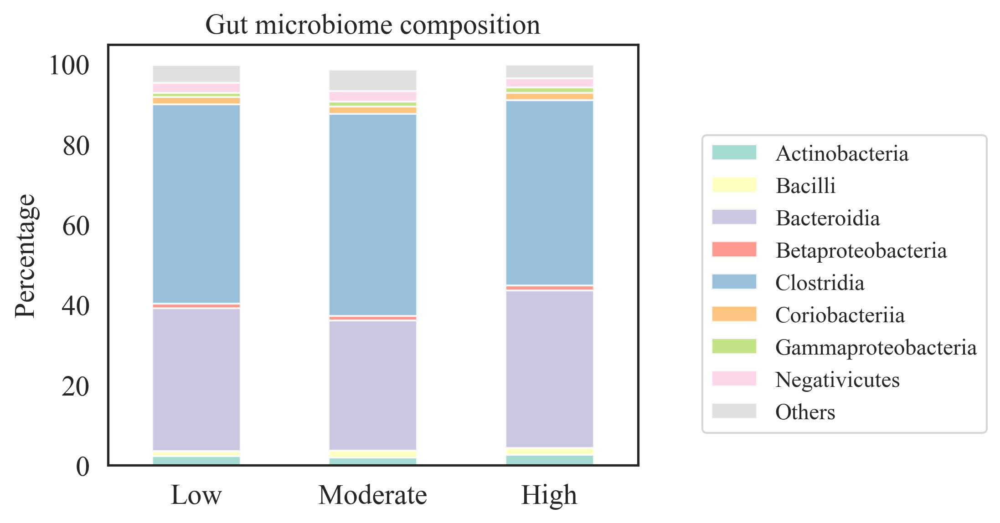

In [70]:
colorset = ['#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5']

plt.rcParams['figure.figsize'] = [5.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

ax = df.set_index('X.clade_name').T.plot.bar(stacked=True, color=colorset, alpha=0.8)
plt.setp(ax.get_xticklabels(), rotation=0)
ax.set_ylabel("Percentage", fontsize=15)
plt.title('Gut microbiome composition', fontsize=15)
ax.legend(bbox_to_anchor=(1.1, 0.05))
plt.show()

In [71]:
# find all files under given directory
####  we only need to change this one line
directory = '../AD baseline/AD saliva metaphlan/'
arr = os.listdir(directory)

try:
    arr.remove('.DS_Store')
except:
    pass

base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]
base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

df_low = OTU
df_medium = OTU
df_high = OTU

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info_low['Patient ID']):
        df_low = df_low.merge(temp, on = "X.clade_name", how = 'left')
        df_low = df_low.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
    elif arr[i].split('_')[1] in list(base_info_medium['Patient ID']):
        df_medium = df_medium.merge(temp, on = "X.clade_name", how = 'left')
        df_medium = df_medium.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
    elif arr[i].split('_')[1] in list(base_info_high['Patient ID']):
        df_high = df_high.merge(temp, on = "X.clade_name", how = 'left')
        df_high = df_high.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 'c' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

Avg = []
for i in range(len(df_low)):
    Avg.append(np.average(df_low.iloc[i, 1:]))
df_low['Low'] = Avg

Avg = []
for i in range(len(df_medium)):
    Avg.append(np.average(df_medium.iloc[i, 1:]))
df_medium['Moderate'] = Avg

Avg = []
for i in range(len(df_high)):
    Avg.append(np.average(df_high.iloc[i, 1:]))
df_high['High'] = Avg
    
df_low = df_low[['X.clade_name', 'Low']]
df_medium = df_medium[['X.clade_name', 'Moderate']]
df_high = df_high[['X.clade_name', 'High']]

threshold = 1
df_low.loc[len(df_low)] = ['Others', df_low[df_low['Low']<threshold]['Low'].sum()]
df_low = df_low[df_low['Low']>=threshold]
df_low = df_low.reset_index(drop=True)
df_medium.loc[len(df_medium)] = ['Others', df_medium[df_medium['Moderate']<threshold]['Moderate'].sum()]
df_medium = df_medium[df_medium['Moderate']>=threshold]
df_medium = df_medium.reset_index(drop=True)
df_high.loc[len(df_high)] = ['Others', df_high[df_high['High']<threshold]['High'].sum()]
df_high = df_high[df_high['High']>=threshold]
df_high = df_high.reset_index(drop=True)

df = df_low.merge(df_medium, on = "X.clade_name", how = 'outer')
df = df.merge(df_high, on = "X.clade_name", how = 'outer')
for i in range(len(df)):
    df.loc[i, 'X.clade_name'] = df.loc[i, 'X.clade_name'].split('|')[-1]
    df.loc[i, 'X.clade_name'] = df.loc[i, 'X.clade_name'].split('__')[-1]
df = df.fillna(0)
df = df.sort_values(by=['X.clade_name'])
temp = df[df['X.clade_name']=='Others']
df = df.drop(df[df['X.clade_name']=='Others'].index[0])
df = pd.concat([df, temp], axis=0)
df

,X.clade_name,Low,Moderate,High
0,Actinobacteria,20.972822,19.922057,23.823845
3,Bacilli,6.818982,13.094383,9.197270
1,Bacteroidia,30.547942,25.064019,29.292396
7,Betaproteobacteria,18.535584,16.385092,14.006867
2,Candidatus_Saccharibacteria_unclassified,1.903918,2.179143,1.655307
4,Clostridia,1.861105,1.807509,2.407571
10,Coriobacteriia,0.000000,1.145927,1.319431
6,Fusobacteriia,2.010326,1.844175,2.107569
8,Gammaproteobacteria,1.615351,2.381694,3.049557
5,Negativicutes,10.640629,11.556605,8.615331


Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [72]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 5.xlsx", engine='openpyxl', mode='a') as writer:
#     df.to_excel(writer, sheet_name='Saliva_Barplot', index=False)

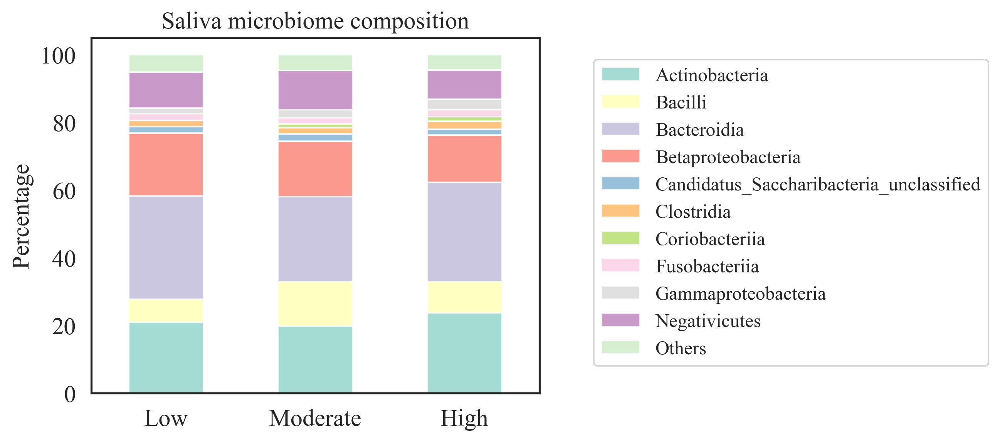

In [73]:
plt.rcParams['figure.figsize'] = [5.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

ax = df.set_index('X.clade_name').T.plot.bar(stacked=True, color=colorset, alpha=0.8)
plt.setp(ax.get_xticklabels(), rotation=0)
ax.set_ylabel("Percentage", fontsize=15)
plt.title('Saliva microbiome composition', fontsize=15)
ax.legend(bbox_to_anchor=(1.1, 0.05))
plt.show()

In [74]:
directory = '../AD baseline/AD gut metaphlan 4/'
arr = os.listdir(directory)
try:
    arr.remove('.DS_Store')
except:
    pass
N = len(arr)

subarr = []
for item in arr:
    subarr.append(item.split('_')[1])
    
base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]

select = []
for i in range(len(base_info)):
    if base_info.loc[i, 'Patient ID'] in subarr:
        select.append(i)
base_info = base_info.loc[select, :]
base_info = base_info.reset_index(drop=True)

base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info['Patient ID']):
        OTU = OTU.merge(temp, on = "X.clade_name", how = 'left')
        OTU = OTU.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
OTU = OTU[OTU.isnull().sum(axis=1) < 0.8*OTU.shape[1]]
OTU = OTU.reset_index(drop=True)

df_low = OTU[['X.clade_name']+list(base_info_low['Patient ID'])]
df_medium = OTU[['X.clade_name']+list(base_info_medium['Patient ID'])]
df_high = OTU[['X.clade_name']+list(base_info_high['Patient ID'])]

droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 's' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

plot_property_high_vs_low = []
for i in range(0, len(df_low)):
    if np.average(list(df_low.iloc[i, 1:]))<np.average(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_low.append('enriched')
    else:
        plot_property_high_vs_low.append('depleted')
        
plot_property_high_vs_medium = []
for i in range(0, len(df_low)):
    if np.median(list(df_medium.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_medium.append('enriched')
    else:
        plot_property_high_vs_medium.append('depleted')
        
plot_property_medium_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_medium.iloc[i, 1:])):
        plot_property_medium_vs_low.append('enriched')
    else:
        plot_property_medium_vs_low.append('depleted')

In [75]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_low = df_low[['X.clade_name']]

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'Binary_name'] = df_high_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_low['pvals1'] = pvals1
df_high_vs_low['pvals2'] = pvals2

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_low.loc[i, 'pvals1'])
    df_high_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_low.loc[i, 'pvals2'])
    
df_high_vs_low['plot_property'] = plot_property_high_vs_low

for i in range(len(df_high_vs_low)):
    if df_high_vs_low.loc[i, 'pvals1'] >= 0.05 and df_high_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_high_vs_low = df_high_vs_low.loc[~df_high_vs_low['Binary_name'].str.startswith('GGB')].reset_index(drop=True)
df_scatter = df_high_vs_low

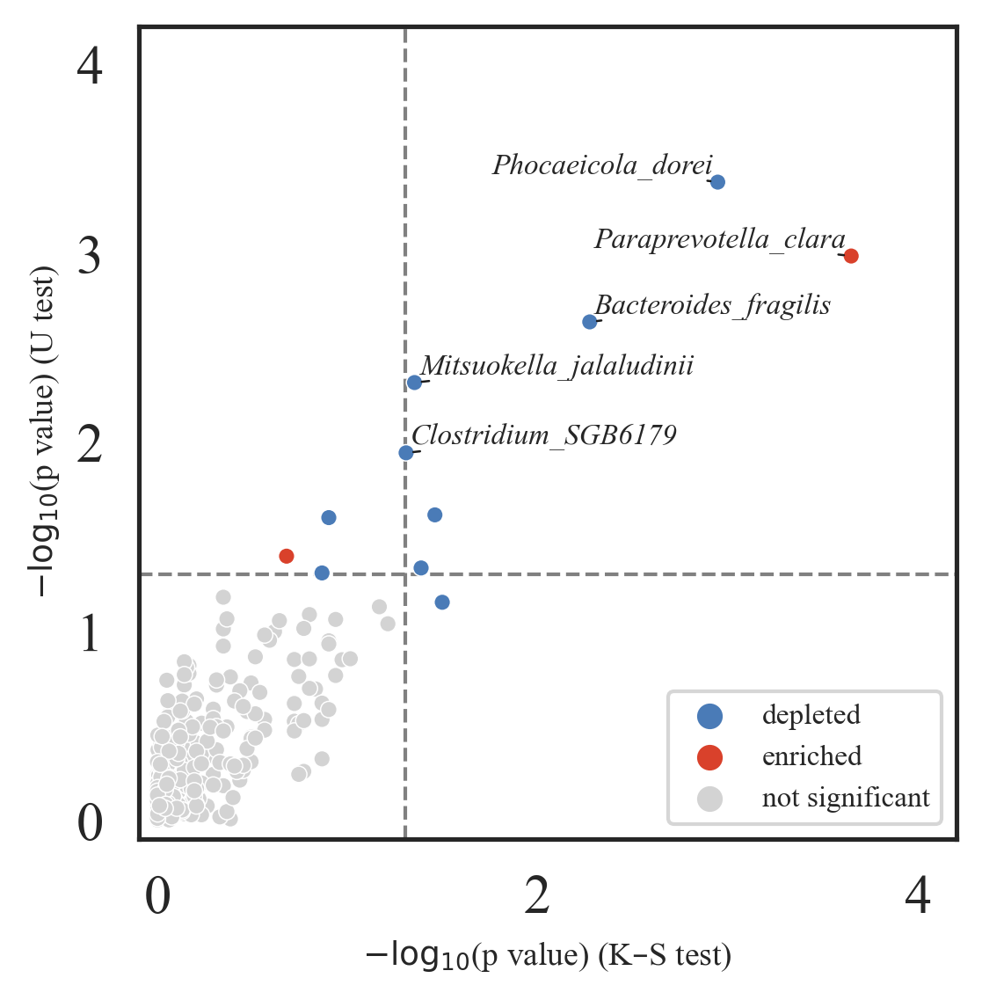

In [76]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.02) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.02):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 4.2)
plt.ylim(-0.1, 4.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [77]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_medium = df_low[['X.clade_name']]

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'Binary_name'] = df_high_vs_medium['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_medium['pvals1'] = pvals1
df_high_vs_medium['pvals2'] = pvals2

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_medium.loc[i, 'pvals1'])
    df_high_vs_medium.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_medium.loc[i, 'pvals2'])
    
df_high_vs_medium['plot_property'] = plot_property_high_vs_medium

for i in range(len(df_high_vs_medium)):
    if df_high_vs_medium.loc[i, 'pvals1'] >= 0.05 and df_high_vs_medium.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_medium.loc[i, 'plot_property'] = 'not significant'

df_high_vs_medium = df_high_vs_medium.loc[~df_high_vs_medium['Binary_name'].str.startswith('GGB')].reset_index(drop=True)
df_scatter = df_high_vs_medium

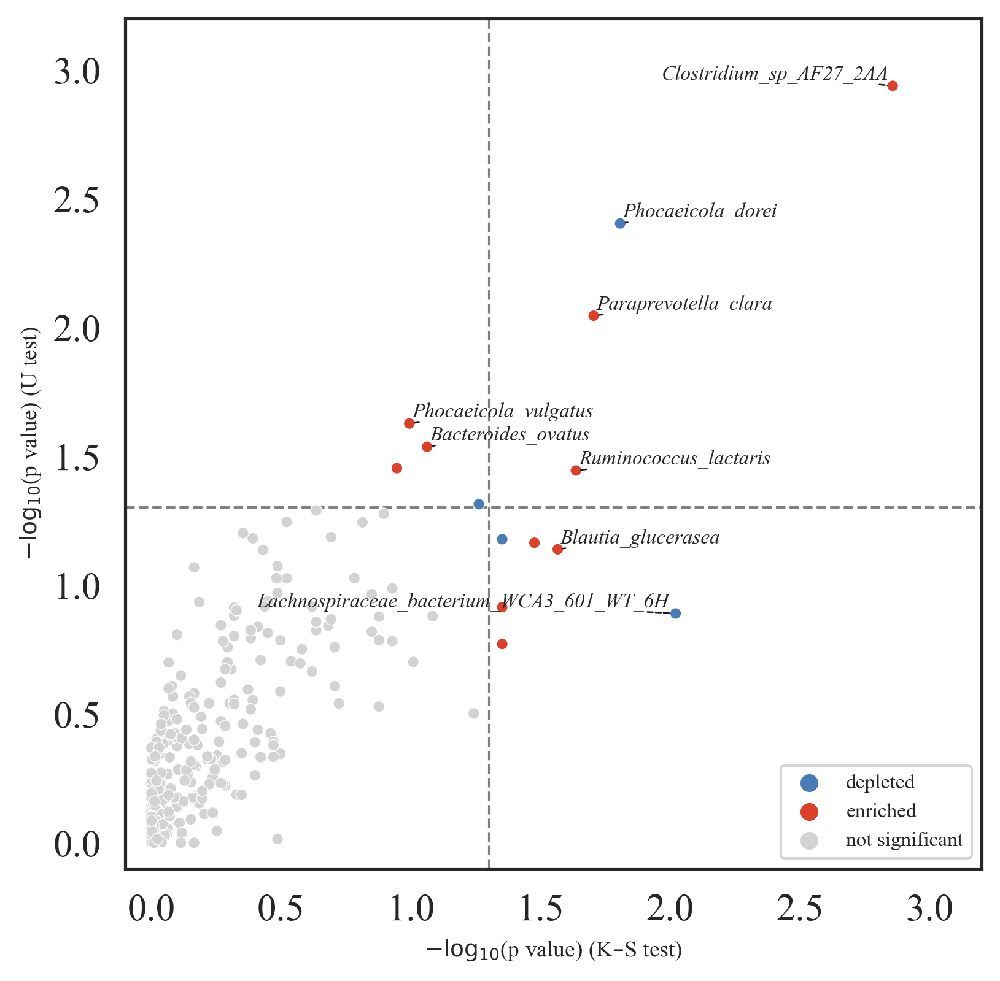

In [78]:
plt.rcParams['figure.figsize'] = [6.0, 6.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.03) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.03):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 3.2)
plt.ylim(-0.1, 3.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [79]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_medium_vs_low = df_low[['X.clade_name']]

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'Binary_name'] = df_medium_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_medium_vs_low['pvals1'] = pvals1
df_medium_vs_low['pvals2'] = pvals2

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_medium_vs_low.loc[i, 'pvals1'])
    df_medium_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_medium_vs_low.loc[i, 'pvals2'])
    
df_medium_vs_low['plot_property'] = plot_property_medium_vs_low

for i in range(len(df_medium_vs_low)):
    if df_medium_vs_low.loc[i, 'pvals1'] >= 0.05 and df_medium_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_medium_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_medium_vs_low = df_medium_vs_low.loc[~df_medium_vs_low['Binary_name'].str.startswith('GGB')].reset_index(drop=True)
df_scatter = df_medium_vs_low

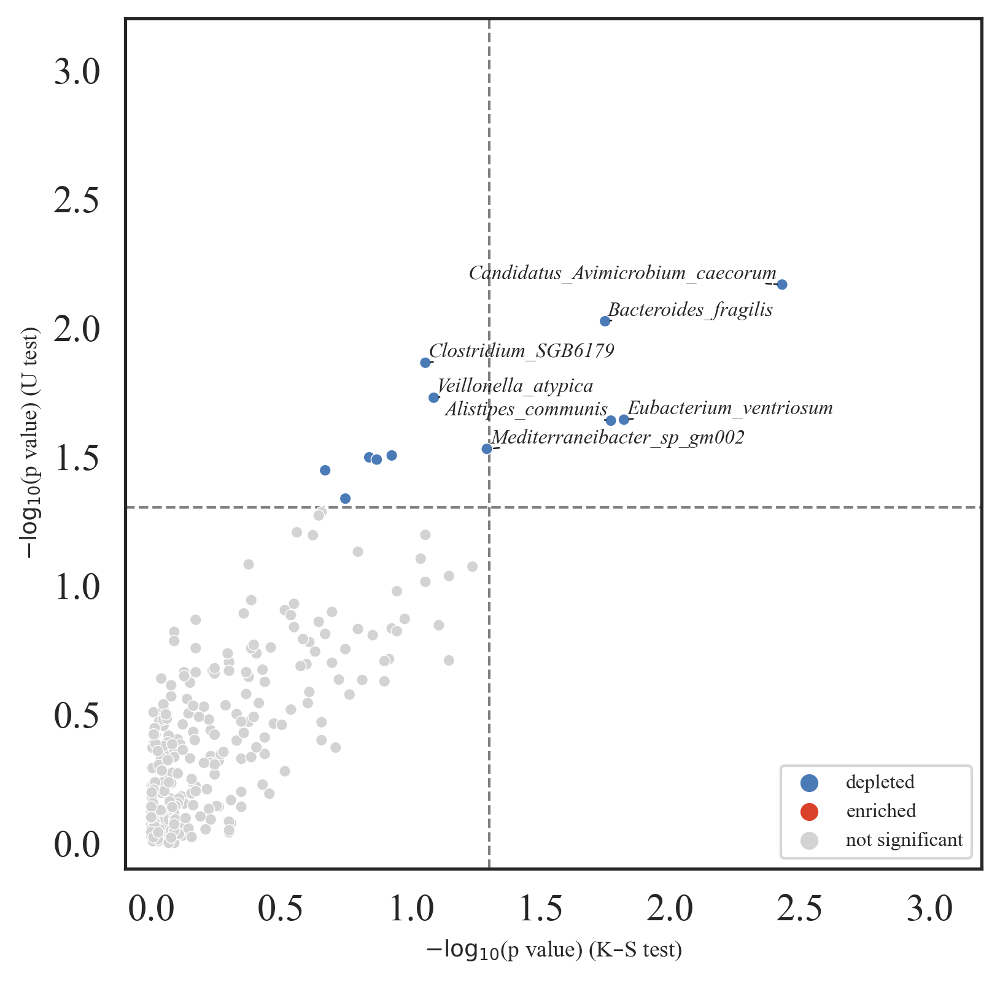

In [80]:
plt.rcParams['figure.figsize'] = [6.0, 6.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.03) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.03):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 3.2)
plt.ylim(-0.1, 3.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [81]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 4.xlsx", engine='openpyxl', mode='a') as writer:
#     df_high_vs_low.to_excel(writer, sheet_name='Gut_High_vs_Low', index=False)
#     df_high_vs_medium.to_excel(writer, sheet_name='Gut_High_vs_Medium', index=False)
#     df_medium_vs_low.to_excel(writer, sheet_name='Gut_Medium_vs_Low', index=False)

In [82]:
directory = '../AD baseline/AD gut metaphlan 4/'
arr = os.listdir(directory)
try:
    arr.remove('.DS_Store')
except:
    pass
N = len(arr)

subarr = []
for item in arr:
    subarr.append(item.split('_')[1])
    
base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]

select = []
for i in range(len(base_info)):
    if base_info.loc[i, 'Patient ID'] in subarr:
        select.append(i)
base_info = base_info.loc[select, :]
base_info = base_info.reset_index(drop=True)

base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info['Patient ID']):
        OTU = OTU.merge(temp, on = "X.clade_name", how = 'left')
        OTU = OTU.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
OTU = OTU[OTU.isnull().sum(axis=1) < 0.8*OTU.shape[1]]
OTU = OTU.reset_index(drop=True)

df_low = OTU[['X.clade_name']+list(base_info_low['Patient ID'])]
df_medium = OTU[['X.clade_name']+list(base_info_medium['Patient ID'])]
df_high = OTU[['X.clade_name']+list(base_info_high['Patient ID'])]

droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 'c' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

plot_property_high_vs_low = []
for i in range(0, len(df_low)):
    if np.average(list(df_low.iloc[i, 1:]))<np.average(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_low.append('enriched')
    else:
        plot_property_high_vs_low.append('depleted')
        
plot_property_high_vs_medium = []
for i in range(0, len(df_low)):
    if np.median(list(df_medium.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_medium.append('enriched')
    else:
        plot_property_high_vs_medium.append('depleted')
        
plot_property_medium_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_medium.iloc[i, 1:])):
        plot_property_medium_vs_low.append('enriched')
    else:
        plot_property_medium_vs_low.append('depleted')

In [83]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_low = df_low[['X.clade_name']]

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'Binary_name'] = df_high_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_low['pvals1'] = pvals1
df_high_vs_low['pvals2'] = pvals2

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_low.loc[i, 'pvals1'])
    df_high_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_low.loc[i, 'pvals2'])
    
df_high_vs_low['plot_property'] = plot_property_high_vs_low

for i in range(len(df_high_vs_low)):
    if df_high_vs_low.loc[i, 'pvals1'] >= 0.05 and df_high_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_low.loc[i, 'plot_property'] = 'not significant'

df_high_vs_low = df_high_vs_low.loc[~df_high_vs_low['Binary_name'].str.startswith('CFGB')].reset_index(drop=True)
df_scatter = df_high_vs_low

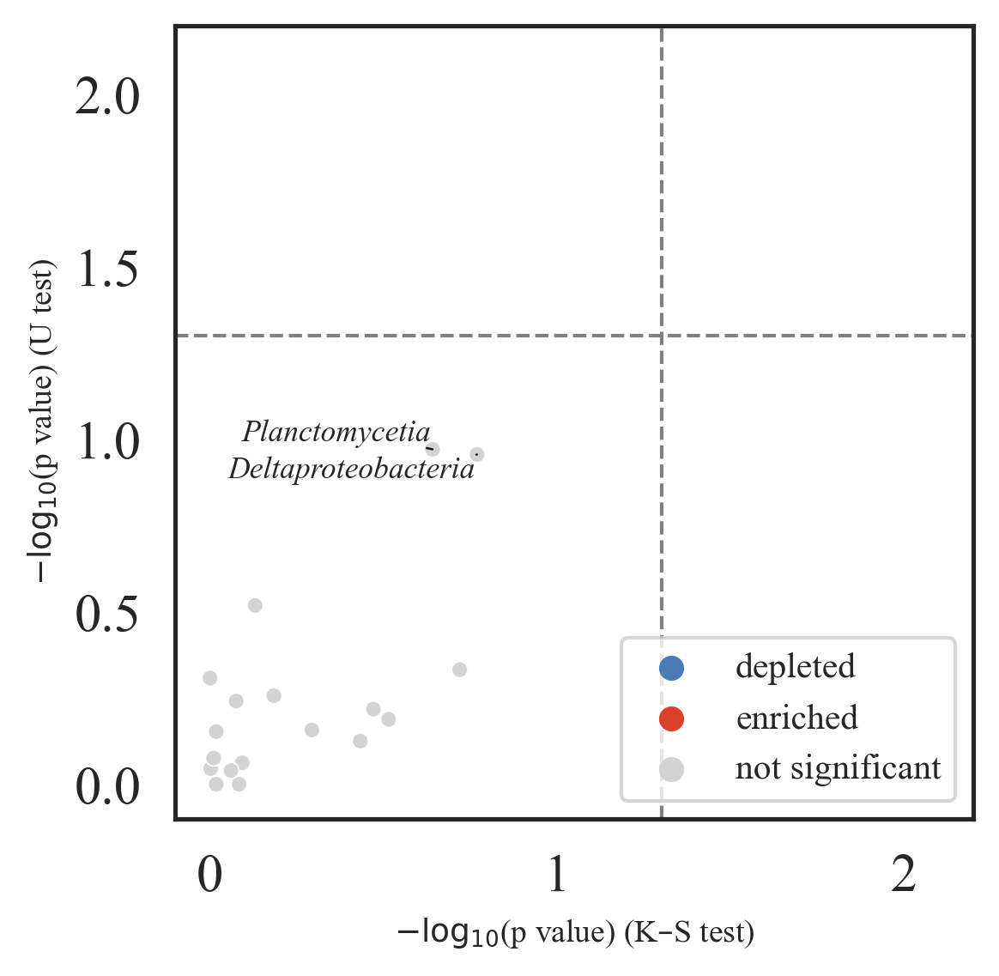

In [84]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.15) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.15):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8.5, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [85]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_medium = df_low[['X.clade_name']]

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'Binary_name'] = df_high_vs_medium['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_medium['pvals1'] = pvals1
df_high_vs_medium['pvals2'] = pvals2

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_medium.loc[i, 'pvals1'])
    df_high_vs_medium.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_medium.loc[i, 'pvals2'])
    
df_high_vs_medium['plot_property'] = plot_property_high_vs_medium

for i in range(len(df_high_vs_medium)):
    if df_high_vs_medium.loc[i, 'pvals1'] >= 0.05 and df_high_vs_medium.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_medium.loc[i, 'plot_property'] = 'not significant'

df_high_vs_medium = df_high_vs_medium.loc[~df_high_vs_medium['Binary_name'].str.startswith('CFGB')].reset_index(drop=True)
df_scatter = df_high_vs_medium

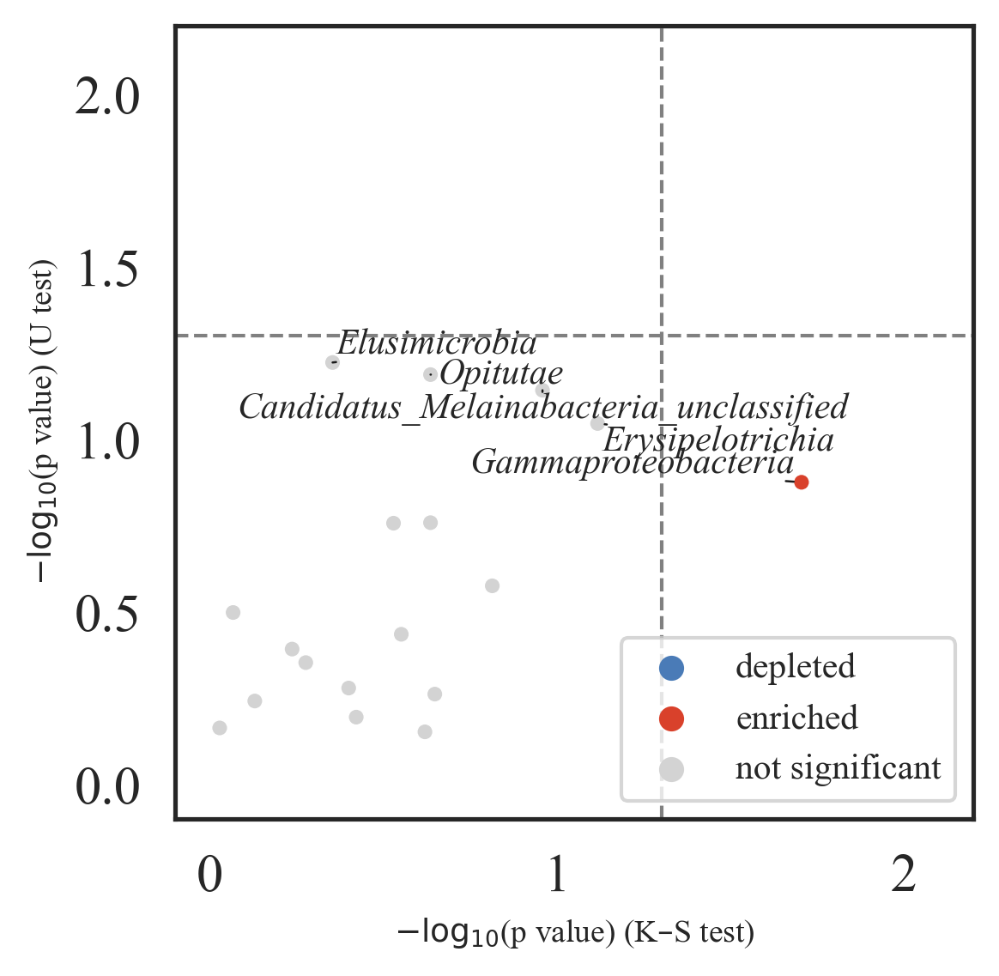

In [86]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.15) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.15):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 10, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [87]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_medium_vs_low = df_low[['X.clade_name']]

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'Binary_name'] = df_medium_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_medium_vs_low['pvals1'] = pvals1
df_medium_vs_low['pvals2'] = pvals2

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_medium_vs_low.loc[i, 'pvals1'])
    df_medium_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_medium_vs_low.loc[i, 'pvals2'])
    
df_medium_vs_low['plot_property'] = plot_property_medium_vs_low

for i in range(len(df_medium_vs_low)):
    if df_medium_vs_low.loc[i, 'pvals1'] >= 0.05 and df_medium_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_medium_vs_low.loc[i, 'plot_property'] = 'not significant'

df_medium_vs_low = df_medium_vs_low.loc[~df_medium_vs_low['Binary_name'].str.startswith('CFGB')].reset_index(drop=True)
df_scatter = df_medium_vs_low

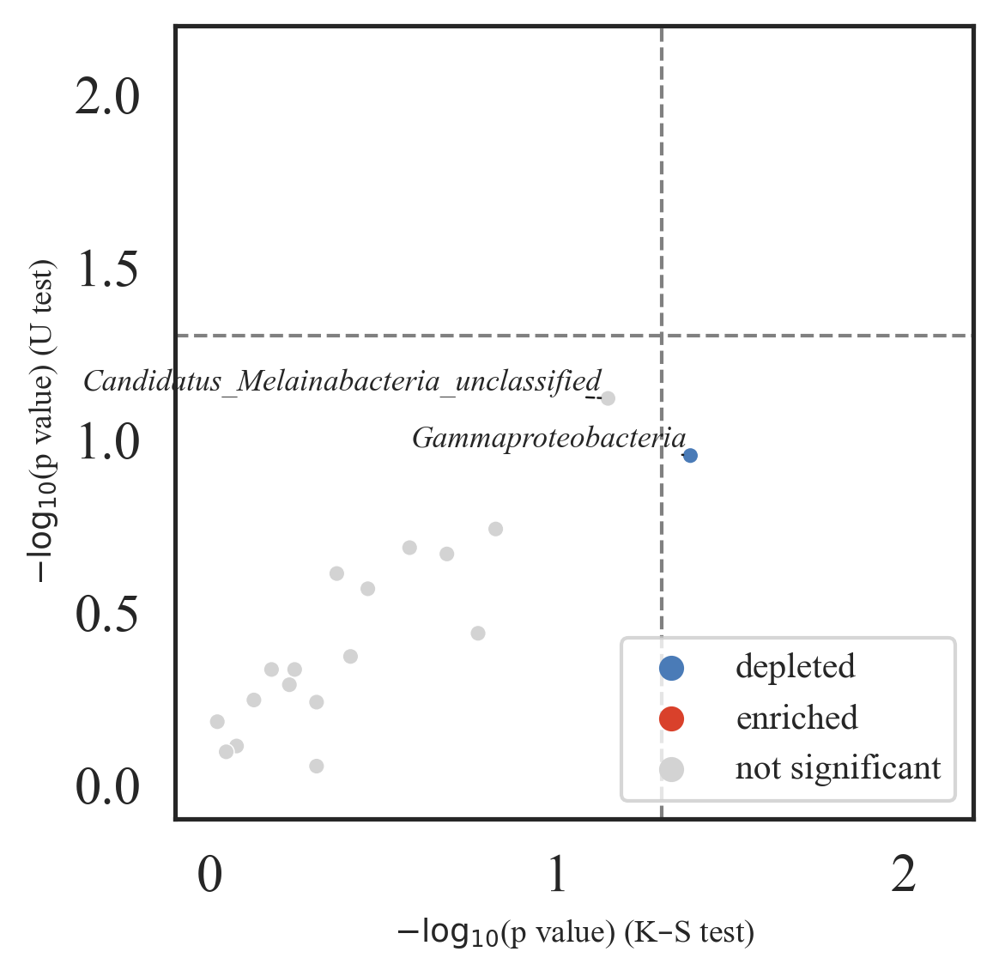

In [88]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.1) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.1):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8.5, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [89]:
directory = '../AD baseline/AD saliva metaphlan/'
arr = os.listdir(directory)

try:
    arr.remove('.DS_Store')
except:
    pass

N = len(arr)

subarr = []
for item in arr:
    subarr.append(item.split('_')[1])
    
base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]

select = []
for i in range(len(base_info)):
    if base_info.loc[i, 'Patient ID'] in subarr:
        select.append(i)
base_info = base_info.loc[select, :]
base_info = base_info.reset_index(drop=True)

base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info['Patient ID']):
        OTU = OTU.merge(temp, on = "X.clade_name", how = 'left')
        OTU = OTU.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
OTU = OTU[OTU.isnull().sum(axis=1) < 0.8*OTU.shape[1]]
OTU = OTU.reset_index(drop=True)

df_low = OTU[['X.clade_name']+list(base_info_low['Patient ID'])]
df_medium = OTU[['X.clade_name']+list(base_info_medium['Patient ID'])]
df_high = OTU[['X.clade_name']+list(base_info_high['Patient ID'])]

droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 's' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

plot_property_high_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_low.append('enriched')
    else:
        plot_property_high_vs_low.append('depleted')
        
plot_property_high_vs_medium = []
for i in range(0, len(df_low)):
    if np.median(list(df_medium.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_medium.append('enriched')
    else:
        plot_property_high_vs_medium.append('depleted')
        
plot_property_medium_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_medium.iloc[i, 1:])):
        plot_property_medium_vs_low.append('enriched')
    else:
        plot_property_medium_vs_low.append('depleted')

In [90]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_low = df_low[['X.clade_name']]

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'Binary_name'] = df_high_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_low['pvals1'] = pvals1
df_high_vs_low['pvals2'] = pvals2

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_low.loc[i, 'pvals1'])
    df_high_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_low.loc[i, 'pvals2'])
    
df_high_vs_low['plot_property'] = plot_property_high_vs_low

for i in range(len(df_high_vs_low)):
    if df_high_vs_low.loc[i, 'pvals1'] >= 0.05 and df_high_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_high_vs_low

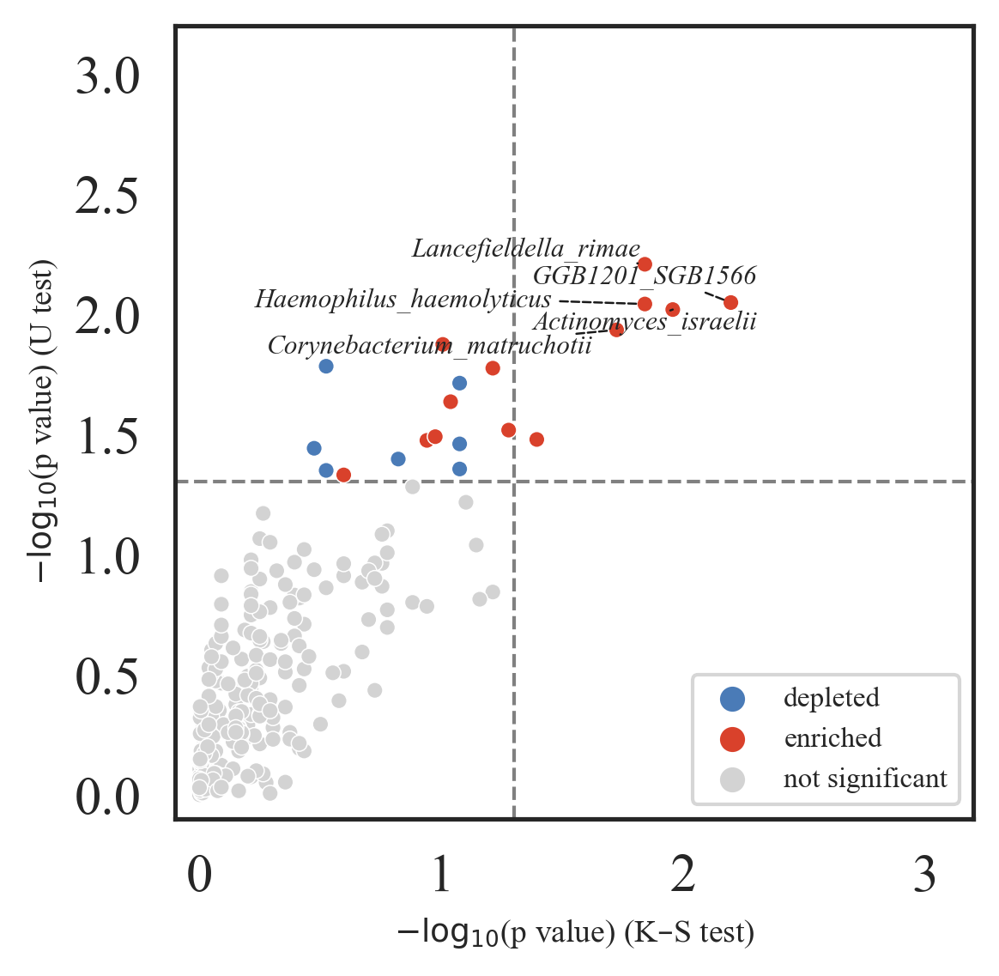

In [91]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.012) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.012):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 7.5, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 3.2)
plt.ylim(-0.1, 3.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [92]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_medium = df_low[['X.clade_name']]

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'Binary_name'] = df_high_vs_medium['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_medium['pvals1'] = pvals1
df_high_vs_medium['pvals2'] = pvals2

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_medium.loc[i, 'pvals1'])
    df_high_vs_medium.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_medium.loc[i, 'pvals2'])
    
df_high_vs_medium['plot_property'] = plot_property_high_vs_medium

for i in range(len(df_high_vs_medium)):
    if df_high_vs_medium.loc[i, 'pvals1'] >= 0.05 and df_high_vs_medium.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_medium.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_high_vs_medium

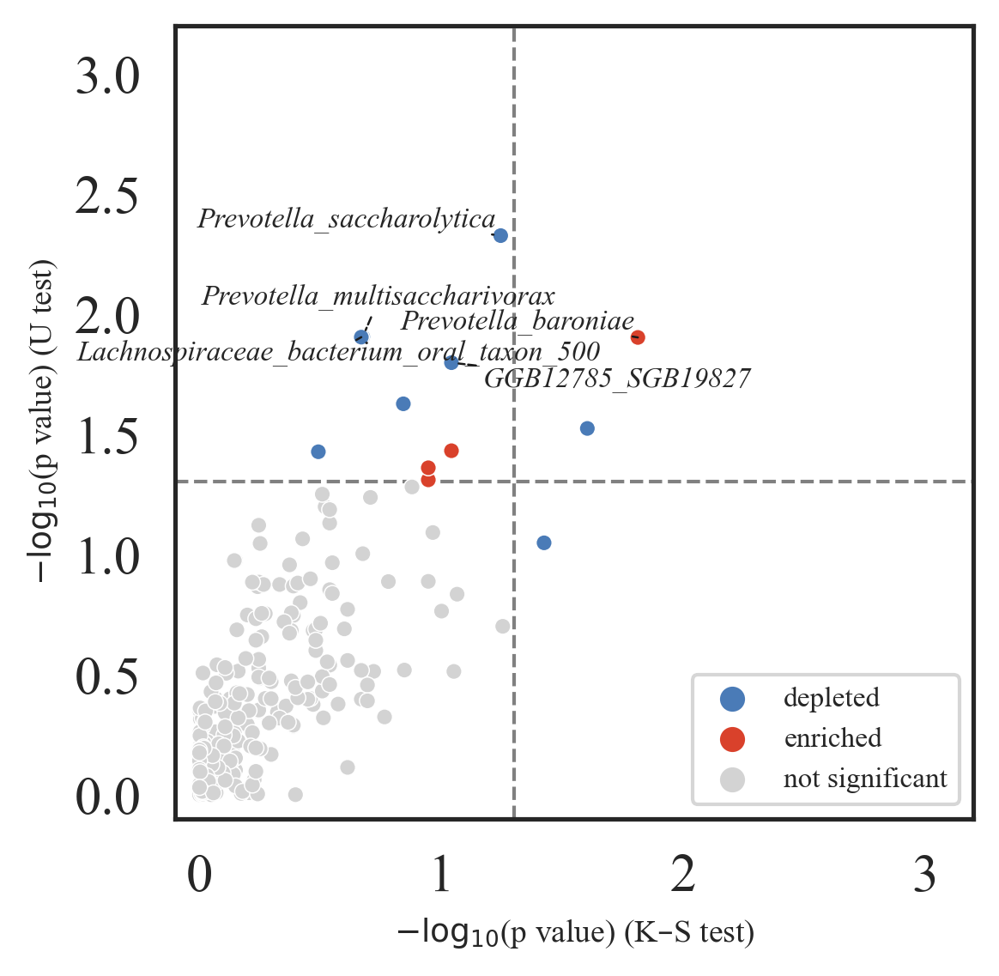

In [93]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.02) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.02):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 3.2)
plt.ylim(-0.1, 3.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [94]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_medium_vs_low = df_low[['X.clade_name']]

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'Binary_name'] = df_medium_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_medium_vs_low['pvals1'] = pvals1
df_medium_vs_low['pvals2'] = pvals2

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_medium_vs_low.loc[i, 'pvals1'])
    df_medium_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_medium_vs_low.loc[i, 'pvals2'])
    
df_medium_vs_low['plot_property'] = plot_property_medium_vs_low

for i in range(len(df_medium_vs_low)):
    if df_medium_vs_low.loc[i, 'pvals1'] >= 0.05 and df_medium_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_medium_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_medium_vs_low

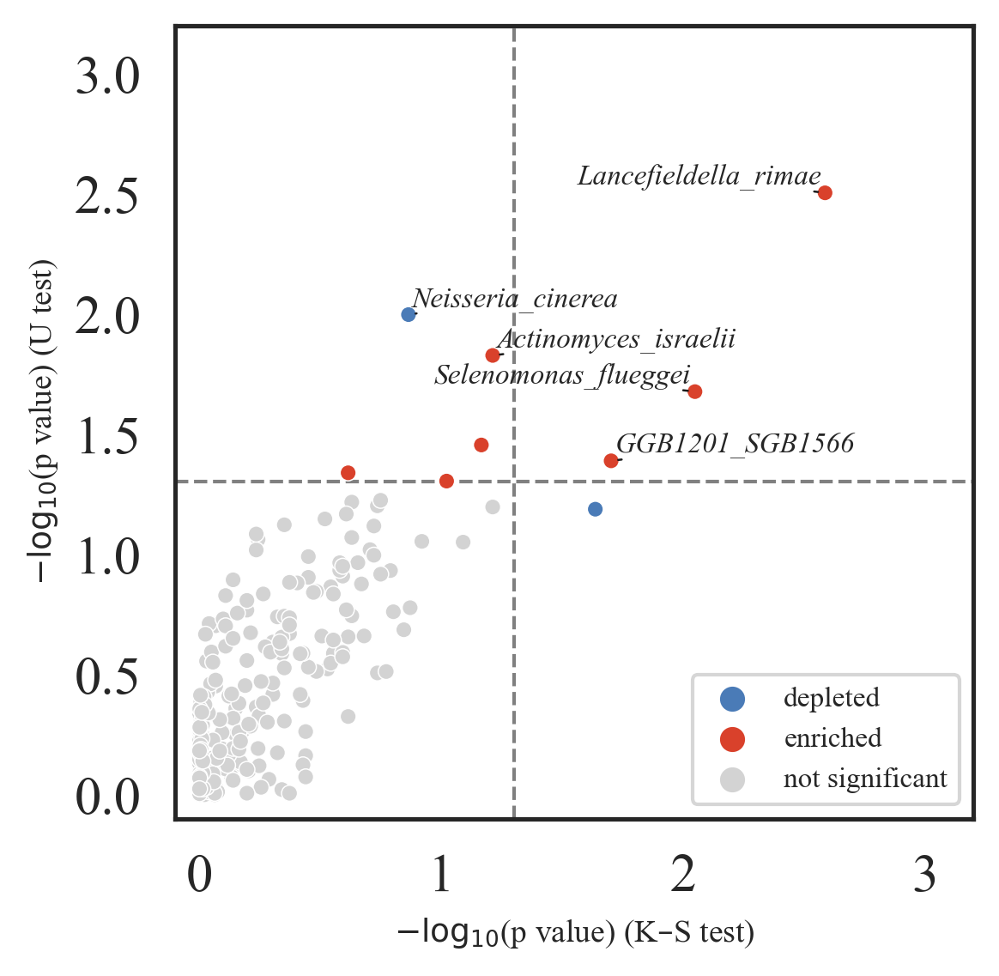

In [95]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 8

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.02) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.02):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 3.2)
plt.ylim(-0.1, 3.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

Run this cell only once, as it creates a new sheet. After the first run, comment out or disable this cell to prevent duplicate sheets.

In [96]:
# with pd.ExcelWriter("../AD baseline/Supplementary Table 5.xlsx", engine='openpyxl', mode='a') as writer:
#     df_high_vs_low.to_excel(writer, sheet_name='Saliva_High_vs_Low', index=False)
#     df_high_vs_medium.to_excel(writer, sheet_name='Saliva_High_vs_Medium', index=False)
#     df_medium_vs_low.to_excel(writer, sheet_name='Saliva_Medium_vs_Low', index=False)

In [97]:
directory = '../AD baseline/AD saliva metaphlan/'
arr = os.listdir(directory)

try:
    arr.remove('.DS_Store')
except:
    pass

N = len(arr)

subarr = []
for item in arr:
    subarr.append(item.split('_')[1])
    
base_info = pd.read_excel('../AD baseline/Supplementary Table 1.xlsx', sheet_name='Clinic_v1_raw')
base_info = base_info[['Patient ID', 'ADAS group']]

select = []
for i in range(len(base_info)):
    if base_info.loc[i, 'Patient ID'] in subarr:
        select.append(i)
base_info = base_info.loc[select, :]
base_info = base_info.reset_index(drop=True)

base_info_low = base_info[base_info['ADAS group']=='Low']
base_info_medium = base_info[base_info['ADAS group']=='Medium']
base_info_high = base_info[base_info['ADAS group']=='High']

temp = set()
for i in range(0, len(arr)):
    temp = set.union(temp, pd.read_excel(directory+arr[i])['#clade_name'])
OTU = pd.DataFrame(temp, columns=['X.clade_name'])
OTU = OTU.sort_values(by=['X.clade_name'])
OTU = OTU.reset_index(drop=True)

for i in range(0, len(arr)):
    temp = pd.read_excel(directory+arr[i])
    temp = temp.rename(columns = {'#clade_name':'X.clade_name'})
    if arr[i].split('_')[1] in list(base_info['Patient ID']):
        OTU = OTU.merge(temp, on = "X.clade_name", how = 'left')
        OTU = OTU.rename(columns = {'relative_abundance': arr[i].split('_')[1]})
        
OTU = OTU[OTU.isnull().sum(axis=1) < 0.8*OTU.shape[1]]
OTU = OTU.reset_index(drop=True)

df_low = OTU[['X.clade_name']+list(base_info_low['Patient ID'])]
df_medium = OTU[['X.clade_name']+list(base_info_medium['Patient ID'])]
df_high = OTU[['X.clade_name']+list(base_info_high['Patient ID'])]

droprows = []
for i in range(0, len(OTU)):
    if OTU['X.clade_name'][i].split('|')[-1][0] != 'c' or OTU['X.clade_name'][i].split('|')[0].split('__')[-1] != 'Bacteria':
        droprows.append(i)
df_low = df_low.drop(droprows)
df_medium = df_medium.drop(droprows)
df_high = df_high.drop(droprows)

df_low = df_low.reset_index(drop=True)
df_medium = df_medium.reset_index(drop=True)
df_high = df_high.reset_index(drop=True)

df_low = df_low.fillna(0)
df_medium = df_medium.fillna(0)
df_high = df_high.fillna(0)

plot_property_high_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_low.append('enriched')
    else:
        plot_property_high_vs_low.append('depleted')
        
plot_property_high_vs_medium = []
for i in range(0, len(df_low)):
    if np.median(list(df_medium.iloc[i, 1:]))<np.median(list(df_high.iloc[i, 1:])):
        plot_property_high_vs_medium.append('enriched')
    else:
        plot_property_high_vs_medium.append('depleted')
        
plot_property_medium_vs_low = []
for i in range(0, len(df_low)):
    if np.median(list(df_low.iloc[i, 1:]))<np.median(list(df_medium.iloc[i, 1:])):
        plot_property_medium_vs_low.append('enriched')
    else:
        plot_property_medium_vs_low.append('depleted')

In [98]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_low = df_low[['X.clade_name']]

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'Binary_name'] = df_high_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_low['pvals1'] = pvals1
df_high_vs_low['pvals2'] = pvals2

for i in range(len(df_high_vs_low)):
    df_high_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_low.loc[i, 'pvals1'])
    df_high_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_low.loc[i, 'pvals2'])
    
df_high_vs_low['plot_property'] = plot_property_high_vs_low

for i in range(len(df_high_vs_low)):
    if df_high_vs_low.loc[i, 'pvals1'] >= 0.05 and df_high_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_high_vs_low

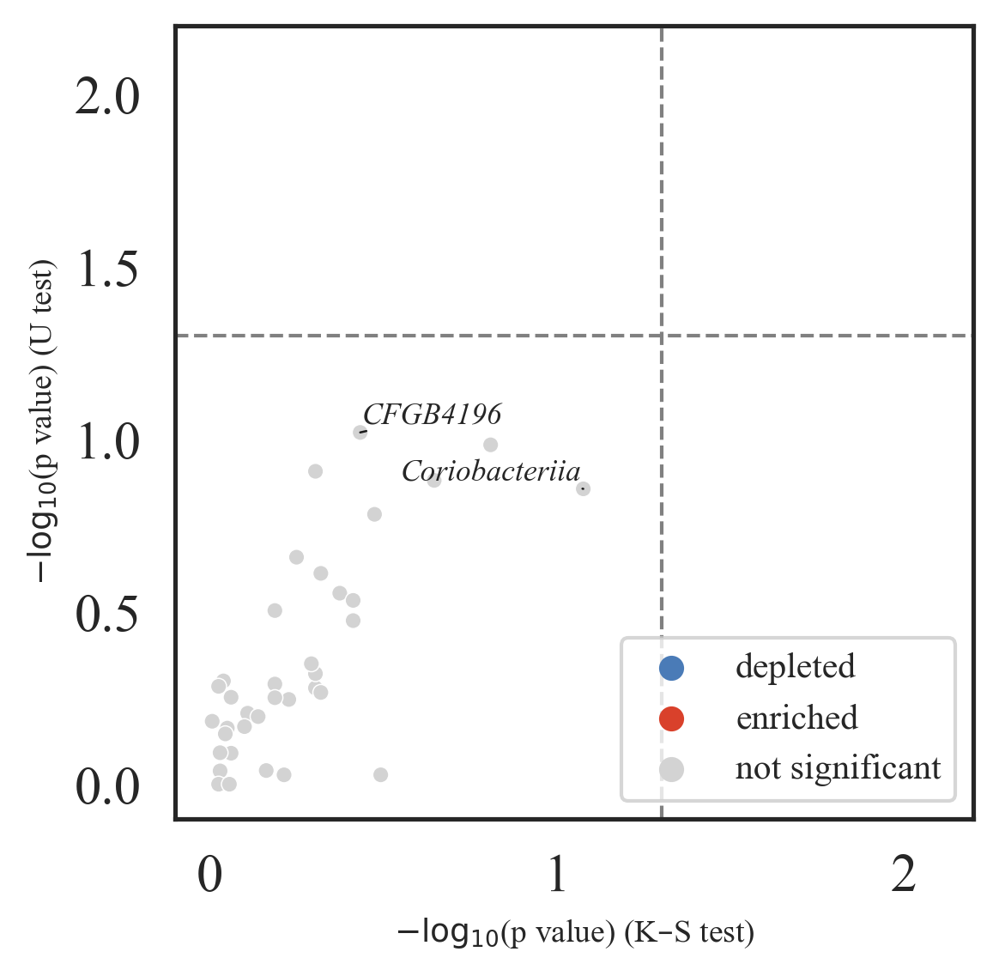

In [99]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.1) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.1):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 8.5, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [100]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_high.iloc[i, 1:]), list(df_medium.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_high_vs_medium = df_low[['X.clade_name']]

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'Binary_name'] = df_high_vs_medium['X.clade_name'][i].split('|')[-1][3:]
    
df_high_vs_medium['pvals1'] = pvals1
df_high_vs_medium['pvals2'] = pvals2

for i in range(len(df_high_vs_medium)):
    df_high_vs_medium.loc[i, 'nlog10pvals1'] = -np.log10(df_high_vs_medium.loc[i, 'pvals1'])
    df_high_vs_medium.loc[i, 'nlog10pvals2'] = -np.log10(df_high_vs_medium.loc[i, 'pvals2'])
    
df_high_vs_medium['plot_property'] = plot_property_high_vs_medium

for i in range(len(df_high_vs_medium)):
    if df_high_vs_medium.loc[i, 'pvals1'] >= 0.05 and df_high_vs_medium.loc[i, 'pvals2'] >= 0.05:
        df_high_vs_medium.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_high_vs_medium

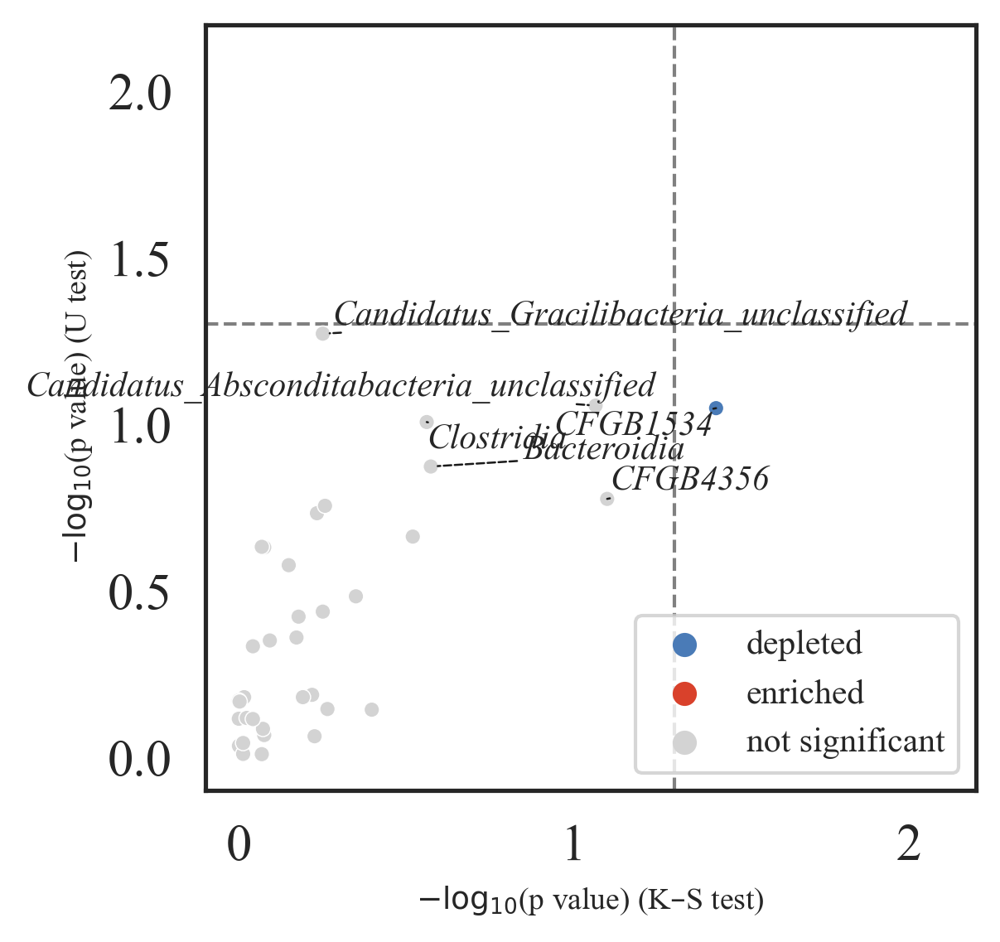

In [101]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.15) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.15):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 10, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()

In [102]:
stat1, stat2, pvals1, pvals2 = [], [], [], []

for i in range(0, len(df_low)):
    s1, p1 = stats.kstest(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    s2, p2 = stats.mannwhitneyu(list(df_medium.iloc[i, 1:]), list(df_low.iloc[i, 1:]))
    stat1.append(s1)
    stat2.append(s2)
    pvals1.append(p1)
    pvals2.append(p2)
    
df_medium_vs_low = df_low[['X.clade_name']]

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'Binary_name'] = df_medium_vs_low['X.clade_name'][i].split('|')[-1][3:]
    
df_medium_vs_low['pvals1'] = pvals1
df_medium_vs_low['pvals2'] = pvals2

for i in range(len(df_medium_vs_low)):
    df_medium_vs_low.loc[i, 'nlog10pvals1'] = -np.log10(df_medium_vs_low.loc[i, 'pvals1'])
    df_medium_vs_low.loc[i, 'nlog10pvals2'] = -np.log10(df_medium_vs_low.loc[i, 'pvals2'])
    
df_medium_vs_low['plot_property'] = plot_property_medium_vs_low

for i in range(len(df_medium_vs_low)):
    if df_medium_vs_low.loc[i, 'pvals1'] >= 0.05 and df_medium_vs_low.loc[i, 'pvals2'] >= 0.05:
        df_medium_vs_low.loc[i, 'plot_property'] = 'not significant'
        
df_scatter = df_medium_vs_low

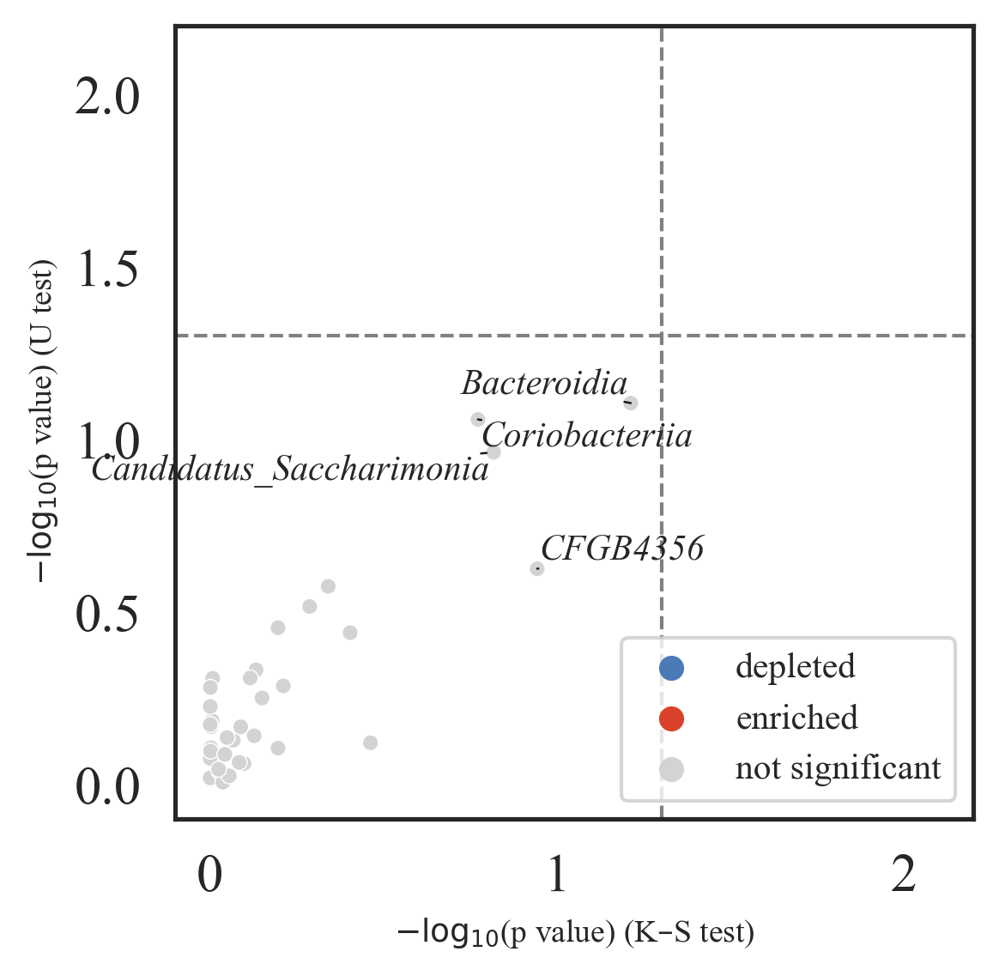

In [103]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["legend.loc"] = 'lower right'
plt.rcParams['legend.fontsize'] = 10

ax = sns.scatterplot(data = df_scatter, x = 'nlog10pvals1', y = 'nlog10pvals2', hue = 'plot_property', hue_order = ['depleted', 'enriched', 'not significant'],
                    palette = ['#4A7BB7', '#D9412B', 'lightgrey'], s=20)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[0:], labels=labels[0:])

texts = []
for i in range(len(df_scatter)):
    if df_scatter.iloc[i].nlog10pvals1 > -np.log10(0.15) or df_scatter.iloc[i].nlog10pvals2 > -np.log10(0.15):
        texts.append(plt.text(x = df_scatter.iloc[i].nlog10pvals1, y = df_scatter.iloc[i].nlog10pvals2, s = df_scatter.iloc[i].Binary_name, fontsize = 10, style = 'italic'))
adjust_text(texts, arrowprops = dict(arrowstyle = '-', ls='dashed', lw=0.6, color = 'k'))

ax.axhline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
ax.axvline(-np.log10(0.05), zorder = 0, c = 'grey', lw = 1, ls = '--')
plt.xlim(-0.1, 2.2)
plt.ylim(-0.1, 2.2)
plt.xlabel("$-\mathrm{log}_{10}$(p value) (K–S test)")
plt.ylabel("$-\mathrm{log}_{10}$(p value) (U test)")
plt.show()